In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 50
VALIDATION_SPLIT = 0.15
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 90.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 3
CONV2D_NEURONS = [64, 64]
CONV2D_SIZE = ["(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [32, 32, 8]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (90.0 percentile): 3.90
Number of outliers (|value| > 11.69): 654
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


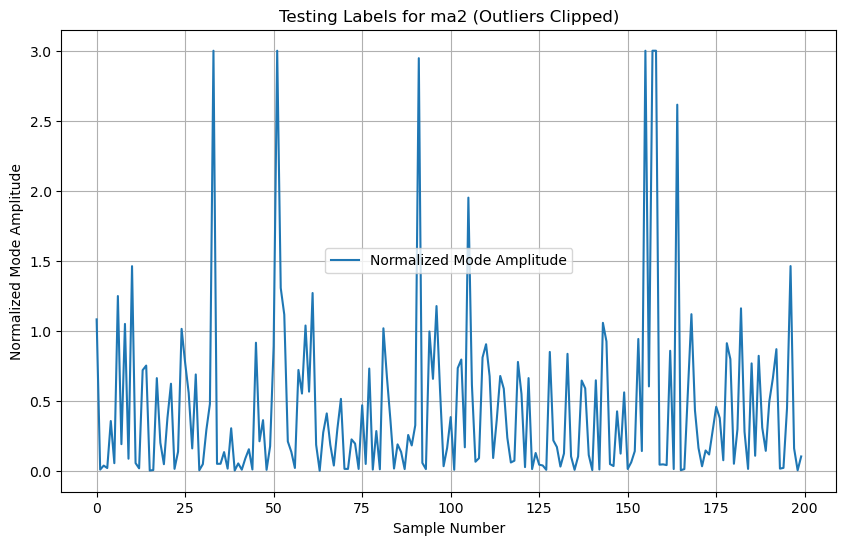

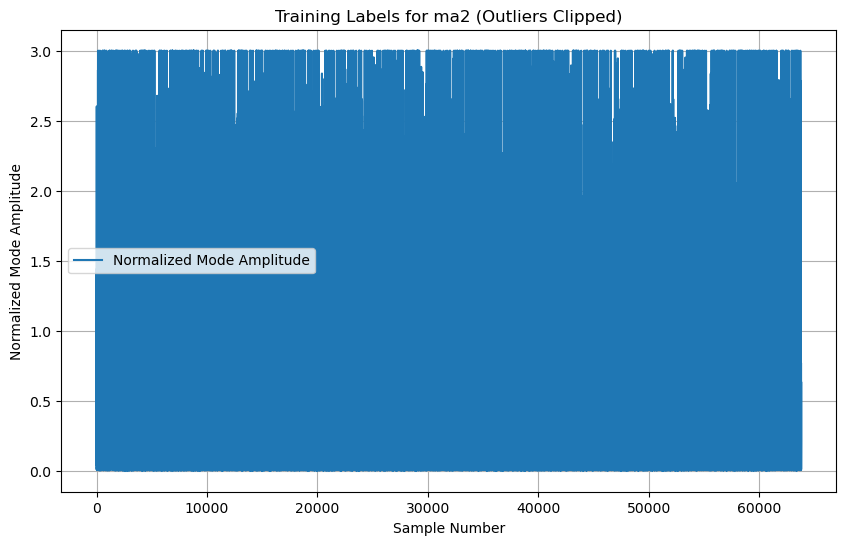

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 20, 20, 64)     │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       591,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │           264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 662,033 (2.53 MB)

 Trainable params: 662,033 (2.53 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 2:52 102ms/step - loss: 0.5605

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.5192  

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.5003

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.4844

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4614

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4492

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4378

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4278

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4199

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4129

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4071

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.4025

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3987

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3956

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3925

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3893

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3863

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3840

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3820

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3804

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3793

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3782

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3773

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3764

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3754

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3743

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3732

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3722

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3711

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3700

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3689

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3678

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3668

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3659

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3650

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3640

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3630

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3619

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3608

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3598

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3587

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3576

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3566

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3555

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3546

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3537

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3527

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3521

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3512

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3504

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3498

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3491

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3484

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3477

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3470

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3464

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3458

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3453

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3447

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3441

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3436

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3430

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3424

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3419

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3414

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3409

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3404

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3399

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3394

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3389

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3384

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3380

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3375

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3371

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3367

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3363

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3359

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3354

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3350

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3346

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3342

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3338

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3334

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3330

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3326

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3322

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3318

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3314

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3310

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3307

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3303

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3299

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3296

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3292

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3289

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3285

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3282

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3279

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3275

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3272

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3269

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3266

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3263

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3260

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3257

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3254

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3251

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3249

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3246

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3243

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3240

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3238

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3235

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3232

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3229

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3227

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3224

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3221

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3218

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3216

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3213

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3211

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3208

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3205

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3203

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3200

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3197

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3195

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3192

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3190

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3187

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3185

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3182

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3180

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3177

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3175

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3172

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3170

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3167

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3165

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3163

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3160

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3158

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3156

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3153

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3151

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3149

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3147

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3145

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3142

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3140

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3138

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3136

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3134

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3132

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3130

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3128

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3126

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3124

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3122

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3120

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3118

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3116

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3114

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3112

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3110

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3109

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3107

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3105

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3103

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3101

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3099

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3097

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3095

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3093

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3091

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3089

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3088

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3086

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3084

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3082

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3080

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3079

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3077

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3075

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3074

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3072

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3070

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3069

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3067

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3066

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3064

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3063

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3061

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3060

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3058

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3057

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3055

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3053

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3052

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3051

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3049

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3048

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3046

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3045

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3043

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3042

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3041

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3039

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3038

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3037

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3035

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3034

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3033

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3031

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3030

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3029

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3027

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3026

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3025

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3023

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3022

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3021

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3020

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3018

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3017

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3016

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3015

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3013

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3012

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3011

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3010

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3009

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3007

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3006

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3005

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3004

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3003

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3002

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3001

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3000

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2999

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2998

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2996

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2995

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2994

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2993

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2992

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2991

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2990

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2989

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2988

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2987

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2986

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2985

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2984

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2983

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2982

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2981

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2980

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2979

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2978

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2977

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2976

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2975

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2974

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2973

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2973

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2972

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2971

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2970

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2969

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2968

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2968

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2967

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2966

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2965

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2964

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2964

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2963

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2962

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2961

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2960

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2960

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2959

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2958

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2958

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2957

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2957

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2956

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2955

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2955

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2954

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2953

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2952

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2951

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2951

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2950

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2949

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2948

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2948

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2947

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2946

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2945

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2945

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2944

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2943

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2943

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2942

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2941

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2940

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2940

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2939

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2938

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2938

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2937

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2936

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2936

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2935

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2934

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2934

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2933

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2932

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2932

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2931

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2930

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2930

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2929

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2928

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2928

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2927

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2926

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2926

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2925

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2924

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2924

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2923

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2923

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2922

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2921

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2921

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2920

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2920

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2919

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2918

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2918

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2917

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2917

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2916

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2915

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2915

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2914

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2914

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2913

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2913

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2912

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2911

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2911

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2910

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2910

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2909

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2909

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2908

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2907

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2907

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2906

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2906

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2905

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2905

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2904

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2904

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2903

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2903

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2902

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2902

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2901

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2901

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2900

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2900

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2899

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2899

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2898

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2898

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2897

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2897

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2896

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2896

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2895

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2895

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2894

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2894

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2893

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2893

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2892

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2892

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2891

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2891

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2890

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2890

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2889

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2889

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2888

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2888

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2888

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2887

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2887

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2886

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2886

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2885

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2885

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2884

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2884

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2883

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2883

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2882

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2882

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2882 

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2881

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2881

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2880

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2880

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2879

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2879

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2878

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2878

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2878

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2877

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2877

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2876

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2876

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2876

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2875

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2875

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2874

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2874

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2874

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2873

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2873

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2872

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2872

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2871

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2871

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2871

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2870

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2870

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2869

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2869

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2868

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2868

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2868

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2867

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2867

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2866

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2866

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2866

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2865

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2865

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2864

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2864

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2864

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2863

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2863

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2862

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2862

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2862

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2861

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2861

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2860

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2860

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2860

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2859

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2859

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2858

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2858

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2858

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2857

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2857

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2857

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2856

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2856

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2855

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2855

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2855

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2854

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2854

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2854

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2853

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2853

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2852

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2852

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2852

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2851

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2851

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2850

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2850

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2850

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2849

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2849

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2849

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2848

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2848

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2847

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2847

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2847

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2846

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2846

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2845

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2845

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2845

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2844

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2844

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2844

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2843

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2843

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2842

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2842

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2842

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2841

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2841

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2841

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2840

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2840

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2840

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2839

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2839

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2839

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2838

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2838

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2838

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2838

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2837

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2837

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2837

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2837

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2836

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2836

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2835

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2835

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2835

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2834

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2834

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2834

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2833

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2833

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2833

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2832

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2832

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2832

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2831

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2831

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2831

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2830

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2830

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2830

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2829

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2829

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2829

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2828

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2828

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2827

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2827

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2827

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2826

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2826

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2826

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2825

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2825

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2825

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2824

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2824

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2824

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2823 - val_loss: 0.2226


Epoch 2/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0512

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0956

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1325

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1635

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1865

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1989

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2087

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2156

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2221

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2271

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2316

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2351

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2379

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2396

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2405

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2410

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2412

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2412

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2410

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2404

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2397

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2390

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2382

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2375

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2368

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2364

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2360

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2353

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2347

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2341

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2335

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2331

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2329

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2326

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2324

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2321

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2318

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2316

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2313

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2311

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2309

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2307

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2305

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2302

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2300

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2299

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2297

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2295

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2292

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2289

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2286

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2283

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2280

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2278

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2276

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2274

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2272

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2271

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2270

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2268

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2267

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2266

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2266

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2265

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2265

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2265

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2265

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2265

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2265

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2264

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2264

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2264

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2264

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2264

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2263

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2263

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2262

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2261

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2260

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2261

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2261

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2261

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2261

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2261

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2261

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2262

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2262

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2262

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2262

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2262

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2263

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2263

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2263

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2263

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2263

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2263

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2263

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2264

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2264

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2264

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2264

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2264

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2263

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2263

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2263

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2263

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2263

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2263

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2263

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2264

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2264

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2264

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2264

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2264

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2264

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2264

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2264

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2264

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2265

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2265

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2266

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2265

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2265

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2265

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2265

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2265

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2265

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2265

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2265

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2264

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2264

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2264

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2264

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2264

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2263

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2263

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2263

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2263

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2263

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2263

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2262

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2262

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2262

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2262

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2262

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2261

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2261

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2261

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2261

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2260

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2260

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2260

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2260

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2260

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2259

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2259

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2259

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2258

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2258

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2258

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2258

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2258

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2258

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2258

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2258

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2258

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2258

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2257

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2257

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2257

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2257

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2257

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2257

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2257

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2257

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2257

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2257

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2257

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2257

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2258

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2259

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2259

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2260

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2260

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2260

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2260

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2260

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2260

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2260

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2260

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2260

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2260

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2260

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2260

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2260

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2260

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2261

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2261

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2261

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2261

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2261

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2262

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2262

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2261

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261 

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2260

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2260

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2260

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2259

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2259

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2259

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2258

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2258

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2258

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2257

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2257

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2257

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2257

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2256

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2256

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2256

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2256

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2256

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2256

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2256

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2255

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2255

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2255

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2255

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2255

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2255

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2255

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2255

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2254

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2254

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2254 - val_loss: 0.2081


Epoch 3/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0840

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1580

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1623

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1679

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1733

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1751

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1766

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1779

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1792

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1796

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1797

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1799

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1800

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1797

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1792

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1790

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1791

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1793

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1795

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1794

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1796

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1800

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1804

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1808

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1811

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1813

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1813

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1814

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1814

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1814

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1815

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1816

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1817

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1820

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1821

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1823

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1824

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1825

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1826

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1827

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1828

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1829

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1830

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1832

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1833

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1834

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1835

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1836

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1837

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1839

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1840

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1841

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1842

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1844

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1845

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1847

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1849

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1851

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1852

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1854

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1856

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1858

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1860

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1861

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1862

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1864

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1865

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1866

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1868

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1869

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1871

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1872

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1874

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1875

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1876

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1878

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1879

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1881

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1883

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1885

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1887

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1888

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1890

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1892

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1894

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1896

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1898

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1900

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1902

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1903

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1905

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1907

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1908

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1910

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1912

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1913

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1915

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1916

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1918

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1919

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1921

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1922

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1924

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1925

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1926

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1928

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1929

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1930

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1932

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1933

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1934

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1935

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1937

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1938

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1939

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1941

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1942

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1943

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1945

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1946

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1947

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1949

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1950

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1951

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1953

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1954

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1955

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1956

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1957

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1958

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1959

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1960

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1961

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1962

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1963

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1964

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1965

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1966

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1967

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1968

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1969

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1970

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1971

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1972

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1972

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1973

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1974

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1975

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1976

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1976

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1977

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1978

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1979

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1979

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1980

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1981

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1981

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1982

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1983

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1983

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1984

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1985

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1985

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1986

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1987

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1987

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1988

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1988

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1989

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1989

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1990

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1990

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1991

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1991

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1992

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1993

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1993

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1994

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1994

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1995

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1996

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1996

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1997

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1997

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1998

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1999

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1999

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2000

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2000

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2001

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2001

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2002

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2003

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2003

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2004

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2004

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2005

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2005

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2006

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2006

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2007

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2007

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2008

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2008

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2009

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2009

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2010

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2010

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2011

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2011

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2012

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2012

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2013

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2013

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2014

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2014

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2015

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2015

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2016

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2017

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2017

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2018

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2018

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2020

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2020

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2021

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2021

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2022

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2022

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2023

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2023

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2024

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2024

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2025

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2025

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2026

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2026

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2027

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2027

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2028

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2028

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2029

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2029

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2029

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2030

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2030

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2031

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2031

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2032

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2032

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2032

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2033

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2033

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2033

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2034

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2034

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2034

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2035

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2035

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2035

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2036

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2036

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2037

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2037

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2037

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2038

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2038

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2038

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2039

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2039

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2039

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2040

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2040

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2040

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2041

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2041

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2042

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2042

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2042

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2043

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2043

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2043

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2044

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2044

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2044

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2044

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2045

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2045

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2045

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2045

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2046

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2046

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2046

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2047

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2047

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2047

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2047

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2048

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2048

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2048

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2048

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2049

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2049

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2049

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2049

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2050

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2050

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2050

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2050

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2051

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2051

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2051

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2051

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2051

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2052

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2052

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2052

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2052

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2052

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2053

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2053

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2053

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2053

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2053

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2054

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2054

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2054

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2054

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2054

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2055

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2055

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2055

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2055

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2055

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2055

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2056

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2058

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2058

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2058

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2058

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2058

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2058

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2058

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2059

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2059

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2060

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2060

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2060

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2060

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2060

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2060

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2060

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2060

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2060

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2060

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2060

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2060

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2060

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2061

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2061

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2061

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2061

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2061

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2061

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2061

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2062

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2062

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2063

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2063

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2063

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2063

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2063

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2063

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2063

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063 

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2063

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2063

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2063

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2064

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2064

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2064

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2065

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2065

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2065

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2065

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2065

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2065

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2065

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2066

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2066

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2066

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2066 - val_loss: 0.2208


Epoch 4/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1902

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2231

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2387

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2456

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2484

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2501

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2504

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2498

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2472

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2465

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2448

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2432

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2416

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2409

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2410

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2407

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2402

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2396

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2390

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2387

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2386

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2385

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2385

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2386

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2387

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2387

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2385

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2381

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2378

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2374

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2371

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2367

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2363

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2358

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2354

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2350

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2344

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2339

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2333

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2328

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2323

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2318

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2313

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2309

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2304

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2300

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2297

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2293

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2290

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2286

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2283

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2279

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2276

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2273

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2270

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2266

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2263

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2259

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2256

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2253

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2250

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2247

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2245

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2242

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2239

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2236

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2234

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2232

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2230

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2228

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2226

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2224

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2223

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2221

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2220

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2219

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2217

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2216

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2214

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2213

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2212

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2210

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2209

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2208

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2206

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2205

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2203

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2202

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2201

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2199

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2198

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2196

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2195

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2193

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2192

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2190

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2189

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2187

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2186

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2185

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2183

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2182

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2180

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2179

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2178

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2176

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2175

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2174

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2172

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2171

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2170

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2168

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2167

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2166

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2165

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2163

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2162

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2161

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2159

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2158

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2157

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2156

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2155

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2154

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2153

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2152

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2151

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2150

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2149

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2148

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2147

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2147

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2146

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2145

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2144

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2143

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2142

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2142

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2141

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2140

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2139

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2139

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2138

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2137

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2137

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2136

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2136

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2135

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2135

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2134

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2134

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2133

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2133

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2133

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2132

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2132

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2131

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2131

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2130

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2130

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2129

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2129

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2129

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2128

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2128

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2128

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2127

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2127

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2127

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2127

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2126

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2126

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2126

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2125

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2125

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2125

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2125

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2124

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2124

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2124

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2124

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2124

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2124

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2123

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2123

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2123

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2123

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2123

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2122

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2122

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2122

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2122

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2122

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2122

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2121

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2121

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2121

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2121

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2121

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2121

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2120

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2120

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2120

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2120

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2120

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2119

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2118

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2118

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2118

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2118

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2118

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2118

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2117

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2117

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2117

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2112

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2107

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2107

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2106

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2106

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2106

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2106

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2106

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2105

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2104

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2104

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2104

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2104

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2104

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2104

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2103

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2103

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2103

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2103

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2103

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2103

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2103

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2102

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2102

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2102

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2102

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2102

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2102

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2102

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2101

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2101

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2101

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2101

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2101

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2101

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2101

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2100

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2100

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2100

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2100

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2100

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2100

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2100

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2100

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2099

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2098

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2097

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2097

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2097

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2097

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2097

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2097

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2097

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2097

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2097

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2097

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2097

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2096

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2095

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2094

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2094

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2094

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2094

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2094

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2094

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2094

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2094

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2094

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2094

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2094

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2094

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2093

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2093

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2093

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2093

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2092

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2091

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2091

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2091

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2091 

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2091

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2091

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2091

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2091

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2091

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2091

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2089

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2089

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2089

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2089

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2089

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2089

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2089

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2088

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2087

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2086

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2086

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2086

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2086

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2086

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2086

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2086

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2086

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2085

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2084

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2082

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2082

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2082

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2082

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2082

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2082

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2082

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2081

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2081

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2081

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2081

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2081

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2081

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2079

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2079

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2079

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2079

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2079

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2079

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2079

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2078

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2078

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2078

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2078

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2078

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2078

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2078

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2077

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2077

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2077

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2077

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2077

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2077

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2077

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2076

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2076

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2076

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2076

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2076

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2076

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2076

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2075

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2075

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2075

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2075

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2075

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2075

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2075

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2075

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2074

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2074

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2074

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2074

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2074

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2074

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2074

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2073

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2073

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2073

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2073

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2073

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2073

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2073

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2073

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2071

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2071

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2071

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2071 - val_loss: 0.1840


Epoch 5/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0875

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1071

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1363

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1544

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1603

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1614

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1628

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1638

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1657

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1671

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1678

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1684

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1690

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1692

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1691

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1694

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1704

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1715

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1723

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1731

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1741

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1750

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1758

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1767

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1776

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1786

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1795

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1802

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1809

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1815

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1821

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1828

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1835

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1842

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1847

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1852

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1857

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1861

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1865

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1869

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1872

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1875

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1878

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1880

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1883

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1886

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1888

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1890

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1892

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1894

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1895

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1896

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1897

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1898

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1899

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1901

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1901

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1902

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1902

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1902

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1902

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1903

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1903

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1904

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1904

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1904

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1904

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1904

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1904

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1905

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1905

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1905

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1905

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1905

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1906

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1906

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1906

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1906

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1905

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1905

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1905

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1904

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1904

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1904

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1903

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1903

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1903

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1902

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1901

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1901

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1900

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1900

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1899

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1899

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1898

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1898

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1897

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1897

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1897

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1897

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1897

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1896

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1896

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1896

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1896

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1896

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1896

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1896

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1895

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1895

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1895

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1895

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1895

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1895

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1895

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1894

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1895

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1895

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1895

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1895

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1895

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1896

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1896

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1896

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1896

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1896

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1897

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1897

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1897

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1897

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1897

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1897

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1897

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1897

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1898

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1898

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1898

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1898

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1898

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1898

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1899

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1899

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1899

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1899

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1900

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1900

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1900

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1900

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1900

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1901

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1901

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1901

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1901

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1901

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1901

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1902

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1902

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1902

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1902

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1902

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1903

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1903

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1903

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1903

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1903

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1903

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1904

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1904

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1904

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1904

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1904

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1904

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1905

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1905

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1905

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1905

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1905

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1905

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1906

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1906

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1906

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1906

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1906

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1906

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1907

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1907

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1907

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1907

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1907

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1908

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1908

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1908

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1908

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1908

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1909

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1909

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1909

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1909

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1909

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1910

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1910

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1910

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1910

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1910

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1911

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1911

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1911

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1911

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1912

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1912

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1912

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1912

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1912

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1913

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1913

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1913

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1913

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1914

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1914

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1914

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1914

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1914

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1915

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1915

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1915

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1915

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1915

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1915

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1916

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1916

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1916

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1916

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1916

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1917

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1917

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1917

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1917

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1917

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1918

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1918

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1918

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1918

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1918

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1919

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1919

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1919

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1919

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1919

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1919

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1920

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1920

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1920

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1920

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1920

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1920

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1920

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1921

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1922

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1922

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1923

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1923

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1923

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1923

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1923

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1923

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1924

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1924

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1925

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1926

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1926

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1927

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1927

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1927

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1927

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1927

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1927

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1928

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1928

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1928

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1928

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1928

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1928

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1928

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1928

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1928

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1928

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1929

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1929

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1930

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1930

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1930

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1930

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1930

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1930

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1930

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930 

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1930

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1931

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1931

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1931

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1931

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1931

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1931

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1932

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1932

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1932

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1932

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1932

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1932

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1933

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1933

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1933

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1933

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1934

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1934

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1934

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1935

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1935

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1935

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1935

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1935

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1935

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1935

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1935 - val_loss: 0.1889


Epoch 6/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1320

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1066

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1297

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1411

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1467

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1538

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1584

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1627

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1649

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1661

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1664

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1665

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1670

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1683

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1694

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1705

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1714

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1718

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1720

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1722

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1726

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1730

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1732

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1734

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1736

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1739

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1743

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1745

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1747

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1749

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1751

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1752

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1752

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1752

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1753

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1753

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1754

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1756

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1756

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1757

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1757

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1758

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1758

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1759

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1760

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1760

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1761

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1762

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1763

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1764

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1764

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1765

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1766

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1767

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1768

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1770

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1771

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1772

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1773

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1775

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1776

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1777

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1779

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1781

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1782

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1783

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1785

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1786

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1787

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1789

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1790

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1792

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1793

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1794

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1795

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1797

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1798

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1799

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1800

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1801

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1802

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1803

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1803

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1804

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1806

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1807

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1807

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1808

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1809

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1810

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1810

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1811

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1812

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1813

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1814

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1815

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1816

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1817

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1817

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1818

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1819

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1820

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1820

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1821

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1822

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1823

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1824

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1825

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1826

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1826

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1827

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1828

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1829

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1829

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1830

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1831

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1832

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1833

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1833

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1834

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1835

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1835

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1836

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1836

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1837

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1837

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1837

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1838

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1838

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1838

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1839

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1839

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1839

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1839

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1840

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1842

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1842

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1842

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1842

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1842

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1845

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1845

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1845

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1845

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1845

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1847

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1847

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1847

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1848

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1848

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1848

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1849

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1849

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1849

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1850

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1850

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1851

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1851

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1852

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1852

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1852

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1853

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1853

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1854

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1854

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1854

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1855

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1855

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1856

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1856

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1856

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1857

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1857

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1857

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1858

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1858

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1858

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1859

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1859

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1859

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1860

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1860

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1860

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1861

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1861

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1861

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1862

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1862

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1862

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1862

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1863

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1863

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1863

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1864

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1864

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1864

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1864

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1865

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1865

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1865

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1865

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1865

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1865

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1866

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1866

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1866

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1866

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1866

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1866

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1867

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1867

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1867

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1867

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1867

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1867

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1868

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1868

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1868

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1868

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1868

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1868

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1868

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1869

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1869

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1869

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1869

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1869

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1869

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1870

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1870

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1870

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1870

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1870

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1870

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1871

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1871

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1871

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1871

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1871

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1871

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1871

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1871

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1872

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1873

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1873

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1873

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1873

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1873

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1873

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1873

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1873

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1874

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1874

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1874

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1874

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1874

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1874

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1874

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1875

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1875

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1875

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1875

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1875

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1875

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1875

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1875

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1875

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1875

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1876

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1876

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1876

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1876

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1876

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1877

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1877

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1877

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1877

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1877

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1877

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1878

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1878

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1878

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1878

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1878

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1878

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1878

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1878

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1880

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1880

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1880

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1880

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1880

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1880

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1880

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1881

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1881

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881 

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1881

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1881

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1882

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1882

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1882

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1882

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1882

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1882

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1882

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1882

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1882

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1882

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1882

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1882

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1882

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1883

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1883

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1884

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1884

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1884

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1884

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1884

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1884

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1884

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1885

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1885

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1885

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1885

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1885 - val_loss: 0.1815


Epoch 7/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2588

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2679

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2637

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2661

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2634

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2585

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2543

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2509

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2492

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2466

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2446

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2419

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2390

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2371

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2350

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2329

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2312

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2297

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2283

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2268

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2254

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2239

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2224

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2210

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2197

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2184

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2171

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2159

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2148

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2138

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2128

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2119

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2109

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2099

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2090

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2080

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2070

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2061

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2052

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2045

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2038

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2032

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2027

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2022

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2016

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2011

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2005

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2000

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1995

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1991

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1987

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1983

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1980

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1976

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1973

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1969

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1966

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1963

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1959

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1957

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1954

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1952

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1950

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1948

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1947

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1946

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1945

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1944

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1943

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1943

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1942

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1941

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1941

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1941

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1940

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1940

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1940

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1940

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1940

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1940

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1939

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1939

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1939

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1938

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1938

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1937

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1937

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1937

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1936

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1936

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1936

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1935

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1935

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1935

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1935

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1934

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1934

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1934

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1933

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1933

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1933

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1932

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1932

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1932

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1931

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1931

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1931

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1930

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1930

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1930

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1930

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1929

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1929

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1929

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1929

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1929

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1928

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1928

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1928

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1928

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1927

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1927

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1927

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1927

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1926

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1926

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1926

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1925

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1925

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1925

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1924

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1924

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1924

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1924

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1923

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1923

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1923

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1923

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1922

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1922

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1922

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1922

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1922

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1921

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1921

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1921

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1921

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1921

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1920

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1920

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1920

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1919

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1919

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1919

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1919

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1918

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1918

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1918

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1917

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1917

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1917

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1917

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1916

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1916

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1916

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1915

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1915

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1915

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1915

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1914

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1914

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1914

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1914

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1913

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1913

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1913

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1913

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1913

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1913

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1913

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1912

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1912

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1912

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1912

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1912

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1911

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1911

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1911

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1911

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1910

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1910

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1910

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1910

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1909

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1909

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1909

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1909

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1908

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1908

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1908

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1908

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1907

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1907

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1907

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1906

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1906

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1906

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1906

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1905

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1905

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1905

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1905

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1904

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1904

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1904

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1904

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1904

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1903

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1903

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1903

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1903

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1902

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1902

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1902

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1902

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1902

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1901

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1901

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1901

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1901

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1901

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1900

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1900

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1900

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1900

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1900

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1899

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1899

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1899

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1899

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1899

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1899

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1898

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1898

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1898

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1898

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1898

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1898

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1898

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1897

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1897

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1897

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1897

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1897

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1897

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1896

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1896

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1896

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1896

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1896

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1896

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1895

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1895

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1895

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1895

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1895

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1894

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1894

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1894

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1894

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1894

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1894

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1893

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1893

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1893

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1893

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1893

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1893

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1892

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1892

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1892

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1892

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1892

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1892

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1891

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1891

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1891

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1891

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1891

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1891

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1891

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1890

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1890

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1890

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1890

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1890

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1890

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1889

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1889

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1889

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1889

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1889

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1889

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1888

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1888

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1888

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1888

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1888

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1887

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1887

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1887

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1887

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1887

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1887

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1886

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1886

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1886

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1886

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1886

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1886

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1885

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1885

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1885

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1885

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1885

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1885

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1884

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1884

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1884

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1884

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1884

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1884

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1883

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1883

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1883

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1883

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1883

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1883

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1882

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1882

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1882

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1882

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1882

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1882

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1882

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1881

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1881

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1881

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1881

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1881

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1881

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1881

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1880

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1880

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1880

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1880

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1880

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1880

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1879

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1879

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1878

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1878

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1878

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1878

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1878

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1878

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1878

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1877

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1877

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1877

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1877

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1877

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1877

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1877

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1877

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1877

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1876

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1875

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1875

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1875

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1875

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1875

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1875

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1875

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1875

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1874

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1873

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873 

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1873

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1872

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1872

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1872

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1872

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1872

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1872

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1872

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1872

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1872

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1872

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1872

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1872

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1872

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1871

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1871

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1871

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1870

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1869

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1869

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1869

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1869

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1869

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1869

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1869

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1869

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1869

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1869

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1868

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1868

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1868

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1868

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1868

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1867

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1867

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1866

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1865

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1865

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1864

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1864

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1863

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1863

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1863 - val_loss: 0.1752


Epoch 8/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0842

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1437

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1487

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1505

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1500

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1486

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1486

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1480

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1473

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1484

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1505

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1528

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1550

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1568

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1588

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1605

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1618

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1629

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1640

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1650

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1660

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1671

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1681

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1692

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1702

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1710

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1717

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1724

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1731

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1738

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1744

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1749

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1756

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1762

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1768

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1773

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1776

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1780

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1782

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1785

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1787

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1789

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1790

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1792

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1794

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1797

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1799

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1801

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1802

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1803

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1804

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1805

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1806

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1806

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1807

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1807

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1808

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1809

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1810

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1810

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1810

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1811

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1811

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1811

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1812

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1812

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1813

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1813

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1814

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1814

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1814

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1814

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1815

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1815

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1815

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1815

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1815

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1815

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1815

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1815

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1815

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1816

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1817

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1817

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1817

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1818

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1818

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1819

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1819

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1820

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1820

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1821

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1821

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1822

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1823

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1823

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1824

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1824

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1825

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1825

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1826

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1827

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1827

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1828

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1828

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1828

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1829

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1829

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1830

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1830

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1831

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1831

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1831

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1832

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1832

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1832

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1833

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1833

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1834

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1834

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1835

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1835

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1835

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1836

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1836

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1836

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1837

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1837

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1837

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1838

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1838

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1838

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1839

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1839

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1839

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1840

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1841

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1842

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1842

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1842

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1842

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1844

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1845

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1845

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1845

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1845

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1845

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1845

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1846

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1847

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1847

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1847

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1847

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1848

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1848

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1848

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1848

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1848

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1847

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1847

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1847

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1847

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1847

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1846

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1846

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1846

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1846

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1845

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1845

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1845

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1845

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1844

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1844

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1844

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1844

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1844

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1844

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1844

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1843

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1843

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1843

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1843

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1843

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1843

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1842

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1842

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1842

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1842

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1842

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1842

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1841

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841 

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1841

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1841

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1841

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1841

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1841

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1841

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1841

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1841

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1840

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1840

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1840

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1839

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1839

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1839

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1839

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1839

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1839

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1839

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1839

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1839

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1838

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1838

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1837

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1837

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1837

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1837

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1837

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1837

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1837

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1836

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1836

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1836

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1836

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1836

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1836

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1835

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1835

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1835 - val_loss: 0.1733


Epoch 9/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1627

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1638

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1712

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1819

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1872

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1887

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1889

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1875

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1861

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1856

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1855

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1863

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1871

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1877

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1882

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1884

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1885

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1885

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1883

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1881

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1880

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1879

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1878

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1876

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1873

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1869

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1865

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1860

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1855

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1850

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1846

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1842

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1837

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1832

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1827

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1823

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1820

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1817

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1815

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1812

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1809

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1807

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1804

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1801

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1798

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1796

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1794

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1791

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1789

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1786

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1784

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1782

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1780

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1777

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1775

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1774

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1772

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1770

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1768

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1766

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1764

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1762

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1760

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1758

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1757

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1755

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1754

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1753

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1752

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1751

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1751

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1750

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1749

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1748

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1747

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1746

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1745

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1744

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1744

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1743

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1742

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1741

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1741

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1740

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1739

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1739

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1738

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1738

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1737

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1737

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1737

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1736

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1736

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1737

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1737

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1737

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1737

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1737

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1738

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1738

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1738

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1738

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1739

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1739

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1739

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1739

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1740

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1740

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1740

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1740

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1740

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1741

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1741

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1741

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1741

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1741

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1741

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1741

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1741

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1741

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1742

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1742

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1742

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1742

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1743

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1743

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1742

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1742

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1742

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1742

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1742

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1742

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1742

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1742

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1741

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1740

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1740

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1740

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1740

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1740

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1740

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1740

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1740

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1740

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1740

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1740

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1739

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1739

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1739

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1739

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1738

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1738

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1737

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1737

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1737

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1737

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1737

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1737

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1737

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1738

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1738

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1737

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1737

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1737

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1736

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1736

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1736

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1736

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1736

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1736

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1736

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1736

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1736

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1735

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1735

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1735

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1735

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1735

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1735

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1735

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1735

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1734

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1734

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1734

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1734

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1735

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1735

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735 

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1735

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1736

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1736

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1736

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1736

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1736

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1736

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1736

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1736

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1737

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1737

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1737

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1737

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1737

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1737

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1737

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1738

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1738

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1738

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1738

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1738

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1738

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1738

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1738

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1739

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1739

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1739

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1739

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1739

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1739

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1739

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1740

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1740

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1740

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1740

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1740

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1740

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1740

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1741

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1741

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1741

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1741

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1741

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1741

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1742

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1742

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1742

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1742

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1742

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1742

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1742

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1743

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1743

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1743

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1743

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1743

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1743

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1743

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1744

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1744

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1744

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1744

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1744

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1744

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1745

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1745

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1745 - val_loss: 0.1795


Epoch 10/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0549

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1713

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1992

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2064

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2089

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2086

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2072

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2070

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2071

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2068

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2068

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2064

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2057

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2050

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2040

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2032

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2023

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2017

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2016

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2014

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2012

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2010

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2006

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2001

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1996

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1992

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1989

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1986

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1985

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1983

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1982

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1981

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1978

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1976

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1973

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1970

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1967

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1964

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1961

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1958

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1955

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1952

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1949

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1946

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1943

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1939

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1936

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1932

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1928

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1925

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1922

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1919

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1916

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1913

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1911

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1909

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1907

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1904

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1902

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1901

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1899

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1897

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1895

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1893

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1892

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1890

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1889

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1887

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1886

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1884

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1882

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1881

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1879

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1877

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1876

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1874

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1872

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1870

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1868

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1866

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1865

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1863

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1862

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1860

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1859

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1857

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1856

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1854

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1853

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1852

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1851

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1849

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1848

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1847

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1846

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1844

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1843

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1842

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1841

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1840

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1839

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1838

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1836

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1835

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1834

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1833

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1832

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1831

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1830

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1829

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1828

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1828

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1827

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1826

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1825

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1824

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1824

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1823

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1822

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1821

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1821

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1820

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1820

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1819

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1818

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1818

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1817

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1817

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1816

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1816

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1815

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1815

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1814

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1814

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1814

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1813

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1813

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1813

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1812

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1812

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1811

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1811

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1811

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1810

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1810

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1810

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1809

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1809

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1809

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1809

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1809

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1809

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1808

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1808

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1808

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1808

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1808

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1807

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1807

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1807

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1807

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1807

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1807

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1806

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1806

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1806

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1806

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1806

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1806

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1805

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1805

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1805

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1805

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1805

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1804

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1804

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1804

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1804

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1804

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1803

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1803

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1803

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1803

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1803

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1802

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1802

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1802

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1802

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1802

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1802

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1801

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1801

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1801

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1801

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1801

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1800

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1800

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1800

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1800

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1799

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1799

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1799

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1799

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1799

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1798

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1798

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1798

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1798

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1798

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1798

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1797

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1797

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1797

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1797

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1797

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1796

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1796

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1796

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1796

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1796

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1796

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1795

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1795

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1795

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1795

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1795

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1795

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1794

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1794

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1794

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1794

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1794

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1794

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1794

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1794

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1793

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1792

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1792

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1792

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1792

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1792

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1792

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1792

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1792

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1792

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1792

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1791

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1790

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1790

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1789

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1789

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1789

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1789

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1789

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1789

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1789

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1789

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1789

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1789

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1789

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1789

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1788

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1788

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1787

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1787

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1786

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1786

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1786

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1786

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1786

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1786

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1786

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1786

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1785

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1785

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1785

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1785

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1785

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1785

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1785

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1784

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1784

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1783

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1783

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783 

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1783

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1783

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1783

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1783

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1783

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1782

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1782

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1782

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1781

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1781

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1781

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1781

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1781

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1781

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1780

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1780

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1780

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1780

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1780

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1780

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1780

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1780

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1780

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1780

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1780

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1780

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1780

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1780

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1780

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1779

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1779

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1779 - val_loss: 0.1670


Epoch 11/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1944

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1788

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1660

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1582

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1611

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1662

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1681

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1686

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1688

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1689

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1692

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1691

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1684

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1674

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1663

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1653

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1645

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1637

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1632

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1629

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1628

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1629

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1630

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1632

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1633

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1635

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1637

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1640

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1644

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1648

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1650

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1652

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1654

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1656

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1658

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1658

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1659

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1659

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1660

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1661

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1661

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1662

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1662

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1662

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1662

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1661

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1661

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1661

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1661

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1660

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1660

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1660

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1660

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1661

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1662

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1663

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1664

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1665

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1666

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1666

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1667

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1668

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1668

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1669

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1670

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1670

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1671

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1671

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1672

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1672

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1672

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1673

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1673

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1673

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1674

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1674

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1675

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1675

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1676

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1676

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1677

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1678

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1679

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1680

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1681

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1682

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1682

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1683

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1684

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1684

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1685

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1685

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1686

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1686

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1687

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1687

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1688

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1688

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1689

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1689

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1690

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1690

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1690

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1691

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1691

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1691

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1692

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1692

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1692

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1693

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1693

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1693

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1694

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1694

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1694

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1694

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1695

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1695

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1695

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1696

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1696

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1696

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1696

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1697

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1697

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1697

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1697

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1697

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1697

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1698

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1698

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1699

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1700

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1700

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1700

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1700

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1700

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1700

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1700

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1701

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1701

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1701

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1702

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1702

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1702

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1702

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1702

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1702

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1702

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1702

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1702

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1702

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1702

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1703

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1704

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1705

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1705

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1705

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1705

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1705

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1705

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1705

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1705

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1706

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1706

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1706

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1706

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1706

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1706

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1707

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1707

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1707

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1707

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1707

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1707

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1707

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1708

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1708

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1708

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1708

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1708

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1708

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1709

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1709

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1709

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1709

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1709

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1709

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1710

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1710

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1710

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1710

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1710

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1710

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1710

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1710

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1710

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1711

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1712

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1712

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1712

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1712

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1712

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1712

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1712

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1712

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1712

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1713

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1714

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1714

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1714

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1714

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1714

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1714

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1714

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1715

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1716

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1716

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1717

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1717

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1717

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1717

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1717

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1717

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1718

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1718

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1718

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1718

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1718

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1718

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1719

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1719

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1719

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1719

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1719

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1719

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1719

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1719

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1719

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1719

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1719

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1720

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1721

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1721

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1722

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1722

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1722

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1722

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1722

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1722

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1722

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1722

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1722

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1722

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1722

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1722

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1723

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1724

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1724 

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1724

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1724

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1725

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1725

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1725

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1725

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1725

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1725

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1725

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1725

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1726

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1726

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1727

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1727

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1727

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1727

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1727

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1727

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1727

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1727

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1726

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1726

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1726 - val_loss: 0.1668


Epoch 12/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1467

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1499

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1470

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1401

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1360

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1355

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1361

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1382

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1412

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1437

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1459

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1473

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1483

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1494

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1504

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1519

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1533

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1544

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1555

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1566

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1577

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1586

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1596

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1607

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1620

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1631

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1641

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1649

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1657

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1665

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1673

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1682

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1688

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1695

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1702

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1708

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1714

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1720

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1724

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1728

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1732

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1737

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1741

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1746

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1750

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1754

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1758

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1762

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1765

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1768

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1772

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1775

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1778

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1781

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1784

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1786

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1788

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1791

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1793

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1794

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1796

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1798

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1799

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1801

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1802

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1803

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1804

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1804

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1804

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1805

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1805

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1805

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1805

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1804

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1804

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1804

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1804

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1803

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1803

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1802

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1802

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1801

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1801

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1801

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1800

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1800

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1800

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1799

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1799

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1798

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1798

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1798

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1797

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1797

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1796

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1796

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1796

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1795

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1795

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1794

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1794

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1794

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1793

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1793

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1792

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1792

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1792

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1791

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1791

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1790

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1790

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1790

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1789

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1789

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1788

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1788

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1788

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1788

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1787

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1787

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1787

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1787

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1786

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1786

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1786

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1786

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1786

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1785

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1785

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1785

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1785

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1785

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1785

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1785

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1786

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1786

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1786

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1786

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1786

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1786

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1787

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1787

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1787

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1787

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1787

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1787

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1787

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1788

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1788

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1788

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1788

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1788

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1787

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1787

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1786

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1785

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1785

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1785

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1785

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1785

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1785

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1785

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1785

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1785

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1785

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1784

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1783

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1783

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1783

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1783

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1783

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1783

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1783

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1783

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1783

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1782

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1781

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1781

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1781

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1781

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1781

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1781

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1781

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1780

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1779

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1779

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1779

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1779

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1779

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1779

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1779

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1779

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1778

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1777

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1777

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1777

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1777

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1777

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1777

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1777

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1777

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1776

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1776

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1776

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1776

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1776

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1776

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1776

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1775

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1775

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1775

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1775

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1775

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1775

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1775

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1775

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1774

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1773

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1773

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1773

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1773

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1773

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1773

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1773

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1772

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1772

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1772

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1772

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1772

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1772

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1772

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1771

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1771

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1771

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1771

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1771

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1771

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1771

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1770

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1770

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1770

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1770

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1770

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1770

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1769

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1769

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1769

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1769

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1769

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1769

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1769

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1768

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1768

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1768

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1768

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1768

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1768

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1768

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1767

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1766

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1766

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1766

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1766

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1766

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1766

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1766

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1765

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1764

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1764

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1764

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1764

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1764 

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1764

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1764

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1763

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1763

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1763

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1763

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1763

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1763

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1763

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1762

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1762

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1762

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1762

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1762

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1762

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1762

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1762

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1761

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1761

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1761

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1761

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1761

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1761

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1761

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1760

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1760

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1760

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1760

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1760

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1760

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1760

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1760

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1759

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1758

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1758

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1758

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1758

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1758

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1758

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1758

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1758

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1758

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1758

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1757

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1756

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1756

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1756

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1755

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1755

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1755

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1755

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1755

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1755

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1755

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1755

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1755

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1754

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1753

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1753

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1753

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1753

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1753

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1753

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1753

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1753

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1753

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1753

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1752

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1751

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1750

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1750

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1750

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1750

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1750

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1750

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1750

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1750

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1750

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1750

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1750

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1750

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1749

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1749

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1749

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1749

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1749

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1748

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1748 - val_loss: 0.1640


Epoch 13/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0752

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1294

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1325

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1278

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1291

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1291

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1292

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1302

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1323

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1343

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1362

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1380

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1400

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1418

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1432

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1444

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1453

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1463

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1470

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1477

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1484

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1490

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1495

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1501

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1505

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1510

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1513

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1514

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1515

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1517

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1519

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1521

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1524

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1527

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1529

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1532

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1535

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1538

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1541

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1543

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1546

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1548

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1549

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1550

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1552

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1554

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1557

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1558

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1560

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1562

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1564

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1565

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1566

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1567

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1568

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1569

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1570

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1571

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1572

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1574

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1575

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1576

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1577

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1578

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1579

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1579

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1580

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1580

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1581

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1581

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1582

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1582

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1583

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1583

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1583

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1584

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1584

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1585

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1585

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1586

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1587

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1587

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1588

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1589

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1589

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1590

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1590

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1591

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1592

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1592

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1593

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1594

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.1595

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1595

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1596

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1597

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1598

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1599

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1600

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1601

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1601

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1602

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1603

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1604

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1605

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1606

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1607

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1608

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.1609

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1609

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1610

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1611

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1612

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1612

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1613

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1614

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1614

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1615

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1615

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1616

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1616

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1617

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1617

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1618

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.1619

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1619

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1620

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1620

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1621

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1622

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1622

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1623

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1623

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1624

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1624

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1625

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1625

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1625

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1626

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1626

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1626

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.1627

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1627

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1627

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1628

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1628

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1628

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1628

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1629

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1629

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1630

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1630

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.1631

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1631

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1631

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1632

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1632

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1633

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1634

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1634

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1635

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1635

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1635

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1636

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1636

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1637

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1637

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1638

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1638

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1638

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1639

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1639

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1640

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1640

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1640

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1641

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1641

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1641

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1642

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1642

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1642

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1643

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1643

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1644

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1644

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1644

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1645

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1645

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1645

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1646

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1646

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1646

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1646

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1647

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1647

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1647

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1647

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1648

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1648

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1648

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1648

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1648

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1649

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1649

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1649

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1649

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1649

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1650

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1650

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1650

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1650

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1650

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1651

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1651

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1651

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1651

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1651

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1652

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1652

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1652

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1652

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1652

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1652

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1653

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1653

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1653

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1653

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1653

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1653

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1654

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1654

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1654

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1654

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1654

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1654

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1655

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1655

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1655

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1655

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1655

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1655

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1656

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1656

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1656

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1656

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1656

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1656

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1657

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1657

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1657

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1657

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1657

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1658

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1658

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1658

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1658

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1658

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1659

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1659

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1659

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1659

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1660

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1660

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1660

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1660

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1660

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1661

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1661

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1661

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1661

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1661

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1662

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1662

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1662

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1662

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1662

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1662

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1663

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1663

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1663

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1663

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1663

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1663

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1664

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1664

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1664

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1664

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1664

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1665

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1665

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1665

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1665

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1665

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1666

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1666

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1666

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1666

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1666

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1666

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1667

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1667

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1667

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1667

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1667

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1667

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1668

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1668

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1668

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1668

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1668

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1668

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1668

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1669

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1669

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1669

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1669

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1669

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1669

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1670

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1670

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1670

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1670

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1670

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1670

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1670

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1670

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1671

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1672

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1672

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1672

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1672

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1672

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1672

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1672

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1672

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1672

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1673

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1673

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1673

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1674

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1675

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1676

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1676

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676 

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1676

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1676

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1676

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1676

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1677

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1677

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1678

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1678

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1678

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1678

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1678

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1678

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1678

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1678

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1679

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1679

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1679

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1679

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1679 - val_loss: 0.1741


Epoch 14/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2269

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2154

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2067

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2021

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1964

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1914

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1885

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1880

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1871

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1866

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1858

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1848

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1841

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1838

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1841

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1841

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1841

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1839

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1834

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1828

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1823

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1819

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1813

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1809

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1806

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1802

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1797

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1793

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1790

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1788

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1785

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1782

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1780

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1777

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1774

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1771

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1769

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1767

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1765

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1763

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1763

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1762

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1760

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1759

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1757

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1756

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1754

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1752

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1750

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1748

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1746

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1744

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1742

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1741

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1739

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1737

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1736

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1734

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1732

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1731

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1730

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1729

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1729

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1728

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1728

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1727

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1727

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1726

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1725

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1725

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1724

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1723

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1723

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1722

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1722

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1721

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1720

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1720

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1719

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1719

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1718

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1717

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1717

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1716

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1715

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1715

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1714

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1713

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1713

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1712

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1711

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1711

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1710

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1709

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1709

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1708

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1708

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1707

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1706

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1706

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1706

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1705

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1705

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1705

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1704

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1704

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1703

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1703

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1703

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1702

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1702

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1702

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1701

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1701

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1701

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1701

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1700

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1700

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1700

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1700

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1699

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1699

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1699

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1699

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1699

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1699

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1699

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1698

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1697

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1696

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1696

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1696

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1696

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1696

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1696

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1697

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1697

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1697

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1697

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1697

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1697

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1697

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1696

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1695

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1695

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1695

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1695

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1695

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1695

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1694

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1693

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1693

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1693

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1693

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1693

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1693

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1693

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1693

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1693

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1693

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1692

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1691

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1691

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1690

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1690

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1689

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1689

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1689

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1689

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1689

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1689

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1689

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1689

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1689

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1689

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1688

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1688

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1688

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1687

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1686

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1686

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1686

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1686

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1686

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1686

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1686

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1686

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1686

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1685

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1684

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1684

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1684

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1684

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1684

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1684

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1684

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1683

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1683

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1683

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1683

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1683

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1683

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1683

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1682

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1682

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1682

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1682

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1682

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1682

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1682

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1681

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1681

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1681

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1681

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1681

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1681

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1681

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1680

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1680

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1680

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1680

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1680

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1680

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1680

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1680

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1679

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1678

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1678

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1678

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1678

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1678

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1678

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1678

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1678

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1677

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1677

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1677

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1677

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1677

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1677

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1677

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1676

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1675

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1674

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1673

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1673

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1672

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1672 

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1671

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1670

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1670

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1670

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1670

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1670

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1670

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1670

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1670

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1670

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1670

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1670

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1669

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1668

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1668

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1668

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1667

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1667

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1667

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1667

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1667

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1667

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1667

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1667

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1667

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1667

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1667

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1667

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1667

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1667

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1666

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1666

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1665

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1665

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1665

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1665

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1665

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1664

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1664

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1664

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1664

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1663

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1663 - val_loss: 0.1585


Epoch 15/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1523

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1213

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1092

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1061

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1129

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1180

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1267

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1306

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1328

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1341

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1356

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1372

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1383

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1390

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1396

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1401

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1403

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1404

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1403

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1404

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1403

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1402

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1404

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1407

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1409

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1411

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1414

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1418

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1421

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1424

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1427

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1431

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1435

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1439

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1444

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1449

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1453

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1457

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1460

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1464

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1468

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1471

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1474

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1477

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1480

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1482

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1485

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1488

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1491

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1493

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1496

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1498

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1501

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1503

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1505

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1507

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1509

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1511

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1513

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1514

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1516

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1518

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1519

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1521

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1522

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1523

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1524

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1525

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1526

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1527

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1528

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1529

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1530

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1531

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1532

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1533

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1534

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1535

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1536

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1537

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1537

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1538

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1539

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1540

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1541

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1541

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1542

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1543

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1544

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1545

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1546

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1547

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1547

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1548

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1549

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1549

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1550

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1550

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1551

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1552

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1552

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1553

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1553

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1554

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1555

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1555

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1556

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1556

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1557

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1557

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1558

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1558

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1559

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1559

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1560

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1560

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1561

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1562

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1562

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1563

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1563

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1564

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1565

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1565

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1566

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1566

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1566

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1567

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1567

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1568

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1568

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1569

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1569

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1569

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1570

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1570

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1572

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1572

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1573

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1573

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1573

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1574

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1574

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1575

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1575

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1575

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1576

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1576

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1577

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1577

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1577

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1578

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1578

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1579

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1579

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1579

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1580

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1580

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1580

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1581

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1581

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1581

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1582

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1582

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1582

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1583

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1583

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1583

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1583

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1584

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1584

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1584

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1584

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1585

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1585

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1585

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1585

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1586

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1586

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1586

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1586

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1587

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1587

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1587

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1588

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1588

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1588

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1588

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1589

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1589

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1589

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1589

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1590

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1590

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1590

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1590

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1591

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1591

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1591

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1591

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1591

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1592

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1592

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1592

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1592

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1592

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1593

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1593

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1593

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1593

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1594

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1594

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1594

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1594

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1594

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1595

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1595

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1595

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1595

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1595

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1596

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1596

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1596

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1596

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1596

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1596

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1597

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1597

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1597

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1597

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1597

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1597

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1597

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1598

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1598

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1598

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1598

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1598

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1598

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1599

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1599

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1599

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1599

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1599

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1599

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1599

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1599

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1600

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1601

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1601

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1601

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1601

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1601

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1601

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1601

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1601

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1601

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1601

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1602

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1602

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1602

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1602

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1603

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1604

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1604

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1604

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1604

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1605

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1605

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1605

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1605

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1605

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1605

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1605

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1606

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1606

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1606

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1607

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1607

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1607

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1607

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1607

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1607

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1607

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1608

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1608

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1608

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1608

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608 

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1608

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1608

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1608

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1608

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1608

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1608

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1609

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1609

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1610

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1610

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1610

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1610

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1610

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1610

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1610

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1610

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1611

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1611

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1611

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1611

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1612

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1612

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1612

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1612

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1612

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1612

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1613

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1614

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1615

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1615

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1616 - val_loss: 0.1581


Epoch 16/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2159

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2855

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2693

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2721

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2731

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2690

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2659

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2623

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2595

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2567

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2536

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2506

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2479

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2458

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2440

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2422

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2407

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2395

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2385

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2374

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2363

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2352

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2342

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2332

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2320

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2308

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2298

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2288

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2277

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2268

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2258

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2249

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2240

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2230

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2221

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2212

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2203

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2195

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2186

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2178

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2169

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2161

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2153

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2145

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2138

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2131

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2125

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2118

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2111

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2105

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2098

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2091

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2085

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2079

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2072

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2066

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2061

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2055

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2049

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2044

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2038

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2033

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2028

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2023

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2018

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2013

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2008

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2004

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2000

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1995

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1988

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1984

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1980

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1977

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1973

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1970

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1967

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1964

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1962

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1959

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1957

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1954

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1952

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1949

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1947

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1944

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1942

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1940

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1937

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1935

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1932

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1930

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1928

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1926

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1924

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1922

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1920

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1919

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1917

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1915

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1913

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1911

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1910

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1908

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1906

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1905

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1903

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1902

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1900

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1899

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1897

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1895

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1894

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1892

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1891

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1889

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1888

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1887

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1885

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1884

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1882

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1881

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1880

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1878

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1877

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1876

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1874

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1873

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1872

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1871

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1870

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1869

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1867

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1866

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1865

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1864

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1863

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1862

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1861

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1860

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1859

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1857

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1856

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1855

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1854

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1853

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1852

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1851

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1850

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1849

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1848

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1847

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1846

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1845

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1844

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1843

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1842

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1841

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1840

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1839

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1838

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1838

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1837

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1836

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1835

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1834

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1833

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1832

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1831

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1830

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1829

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1828

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1827

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1827

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1826

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1825

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1824

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1823

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1823

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1822

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1821

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1820

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1819

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1819

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1818

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1817

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1816

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1815

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1815

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1814

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1813

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1812

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1811

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1811

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1810

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1809

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1808

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1808

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1807

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1806

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1805

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1805

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1804

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1803

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1802

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1802

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1801

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1800

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1799

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1799

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1798

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1797

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1796

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1796

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1795

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1794

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1794

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1793

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1793

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1792

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1791

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1791

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1790

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1789

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1789

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1788

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1787

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1787

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1786

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1785

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1785

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1784

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1783

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1783

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1782

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1781

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1781

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1780

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1779

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1779

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1778

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1777

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1777

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1776

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1776

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1775

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1774

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1774

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1773

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1773

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1772

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1771

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1771

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1770

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1770

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1769

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1769

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1768

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1768

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1767

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1766

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1766

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1765

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1765

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1764

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1764

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1763

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1763

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1762

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1762

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1761

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1761

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1760

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1760

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1759

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1759

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1758

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1758

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1757

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1757

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1756

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1756

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1755

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1755

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1755

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1754

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1754

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1753

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1753

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1752

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1752

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1751

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1751

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1751

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1750

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1750

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1749

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1749

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1749

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1748

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1748

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1747

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1747

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1747

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1746

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1746

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1745

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1745

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1745

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1744

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1744

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1744

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1743

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1743

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1742

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1742

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1742

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1741

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1741

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1741

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1740

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1740

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1740

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1739

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1739

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1739

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1738

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1738

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1738

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1737

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1737

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1737

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1736

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1736

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1736

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1735

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1734

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1734

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1734

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1733

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1733

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1733

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1732

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1732

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1732

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1732

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1731

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1731

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1731

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1731

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1730

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1730

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1730

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1730

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1729

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1729

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1729

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1729

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1728

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1728

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1728

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1727

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1727

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1727

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1727

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1727

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1726

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1726

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1726

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1726

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1725

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1725

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1725

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1725

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1725

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1724

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1724

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1724

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1724

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1724

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1723

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1722

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1722

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1722

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1722

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1722

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1722

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1721

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1721

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1721

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1721

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1721

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1720

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1720

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1720

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1720

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1720

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1720 

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1719

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1719

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1719

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1719

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1719

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1718

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1718

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1718

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1718

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1718

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1718

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1717

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1717

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1717

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1717

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1717

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1716

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1716

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1716

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1716

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1716

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1716

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1716

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1715

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1715

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1715

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1715

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1715

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1715

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1714

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1714

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1714

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1714

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1714

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1714

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1714

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1713

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1713

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1713

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1713

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1713

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1713

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1712

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1712

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1712

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1712

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1712

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1712

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1712

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1711

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1711

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1711

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1711

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1711

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1711

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1711

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1710

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1710

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1710

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1710

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1710

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1710

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1710

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1709

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1709

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1709

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1709

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1709

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1709

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1709

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1708

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1708

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1708

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1708

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1708

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1708

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1708

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1707

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1707

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1707

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1707

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1707

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1707

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1707

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1706

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1706

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1706

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1706

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1706

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1706

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1706

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1705

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1705

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1705

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1705

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1705

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1705

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1705

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1704

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1703

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1703

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1703

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1703

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1703

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1703

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1703

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1702

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1701

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1701

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1701

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1701

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1701

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1701

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1701

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1700

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1700

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1700

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1700

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1700

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1700

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1700

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1699

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1699

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1699

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1699

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1699

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1699

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1699

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1698

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1698

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1698

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1698

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1698

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1698

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1698

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1698

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1697

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1697

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1697

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1697

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1697

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1697

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1697

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1696

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1696

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1696

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1696 - val_loss: 0.1598


Epoch 17/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2644

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2037

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1791

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1703

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1691

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1707

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1715

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1714

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1703

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1700

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1705

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1710

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1714

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1716

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1713

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1708

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1704

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1701

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1695

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1694

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1695

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1697

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1700

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1703

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1704

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1705

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1706

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1707

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1708

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1709

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1711

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1712

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1712

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1711

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1711

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1709

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1708

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1706

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1705

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1704

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1703

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1702

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1702

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1701

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1701

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1700

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1700

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1699

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1698

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1697

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1697

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1696

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1694

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1693

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1692

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1691

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1690

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1689

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1688

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1687

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1686

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1686

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1685

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1685

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1684

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1683

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1682

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1681

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1680

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1679

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1678

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1677

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1676

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1675

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1674

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1674

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1673

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1672

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1671

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1670

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1670

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1669

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1668

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1667

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1666

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1666

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1665

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1664

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1663

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1662

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1661

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1660

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1659

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1658

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1657

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1656

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1655

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1654

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1653

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1653

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1652

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1651

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1650

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1649

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1649

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1648

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1647

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1646

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1646

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1645

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1644

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1644

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1643

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1642

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1642

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1641

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1641

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1641

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1640

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1640

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1639

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1639

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1639

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1638

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1638

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1638

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1638

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1637

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1637

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1637

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1637

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1636

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1636

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1636

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1635

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1635

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1635

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1634

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1634

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1633

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1633

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1633

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1632

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1632

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1631

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1631

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1630

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1630

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1629

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1629

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1628

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1628

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1627

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1627

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1627

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1626

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1626

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1626

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1625

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1625

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1624

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1624

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1624

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1623

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1623

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1623

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1623

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1622

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1622

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1622

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1621

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1621

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1621

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1620

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1620

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1620

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1620

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1619

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1619

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1619

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1618

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1618

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1618

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1618

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1618

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1617

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1617

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1617

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1617

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1617

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1616

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1616

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1616

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1616

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1616

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1616

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1616

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1615

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1615

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1615

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1615

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1615

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1615

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1614

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1613

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1613

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1613

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1613

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1613

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1613

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1613

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1613

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1612

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1611

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1610

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1610

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1610

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1610

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1610

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1610

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1610

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1610

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1610

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1610

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1609

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1609

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1609

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1610

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1610

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1610

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1610

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1611

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1611

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1611

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1611

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1611

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1611

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1611

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1611

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1611

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1611

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1611

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1612

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1612

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1613

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1613

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1614

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1614

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1615

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1615

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1615

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615 

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1615

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1615

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1615

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1615

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1616

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1616

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1616

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1616

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1616

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1616 - val_loss: 0.1628


Epoch 18/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1327

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1193

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1301

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1386

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1423

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1439

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1466

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1487

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1516

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1543

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1557

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1572

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1582

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1592

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1599

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1607

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1616

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1625

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1630

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1633

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1636

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1638

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1639

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1640

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1641

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1641

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1641

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1639

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1637

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1636

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1634

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1632

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1629

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1626

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1623

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1621

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1618

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1616

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1614

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1612

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1610

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1609

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1607

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1605

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1604

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1603

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1602

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1601

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1600

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1599

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1598

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1597

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1595

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1594

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1593

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1593

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1592

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1591

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1591

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1590

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1589

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1588

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1588

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1587

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1587

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1586

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1585

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1585

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1584

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1584

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1584

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1584

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1584

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1584

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1584

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1584

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1583

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1583

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1584

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1584

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1585

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1585

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1586

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1587

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1588

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1589

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1590

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1590

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1591

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1592

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1593

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1593

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1594

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1595

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1595

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1596

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1597

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1597

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1598

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1598

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1599

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1600

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1600

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1601

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1601

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1602

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1602

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1603

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1603

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1603

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1604

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1604

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1604

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1605

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1605

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1605

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1605

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1605

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1607

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1607

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1607

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1608

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1608

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1609

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1609

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1609

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1609

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1609

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1609

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1609

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1609

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1608

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1607

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1608

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1608

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1608

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1608

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1608

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1608

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1608

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1608

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1608

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1608

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1608

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1609

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1610

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1610

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1610

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1610

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1610

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1610

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1610

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1611

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1612

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1612

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1612

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1612

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1612

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1612

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1612

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1612

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1612

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1612

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1613

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1614

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1614

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1614

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1614

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1614

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1614

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1614

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1614

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1615

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1615

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1615

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1616

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1617

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1617

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1617

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1617

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1618

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1618

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1618

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1617

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1618

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1618

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1617

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1617

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1617

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617 

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1617

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1617

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1617

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1617

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1617

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1617

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1617

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1616

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1616

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1616

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1615

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1615

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1614

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1614

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1614

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1614

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1613

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1613

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1612

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1612

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1612

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1612

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1612 - val_loss: 0.1533


Epoch 19/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1588

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1246

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1434

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1523

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1538

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1525

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1503

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1486

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1474

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1476

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1474

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1482

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1489

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1495

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1499

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1505

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1511

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1514

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1519

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1524

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1527

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1532

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1535

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1537

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1540

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1543

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1544

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1546

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1547

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1548

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1549

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1549

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1550

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1551

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1553

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1553

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1554

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1553

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1552

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1552

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1551

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1551

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1551

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1551

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1552

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1552

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1552

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1552

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1552

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1552

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1553

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1553

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1554

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1554

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1555

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1555

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1555

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1556

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1556

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1556

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1556

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1556

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1555

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1555

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1555

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1555

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1554

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1554

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1554

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1554

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1553

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1553

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1553

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1552

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1552

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1552

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1551

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1551

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1551

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1551

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1550

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1550

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1550

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1549

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1549

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1549

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1548

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1548

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1547

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1547

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1547

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1546

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1546

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1546

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1546

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1545

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1545

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1545

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1544

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1544

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1544

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1544

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1543

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1543

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1543

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1542

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1542

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1542

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1541

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1541

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1541

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1541

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1540

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1540

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1540

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1539

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1539

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1539

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1539

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1539

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1539

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1539

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1539

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1538

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1538

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1538

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1538

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1539

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1539

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1540

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1540

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1540

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1540

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1540

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1540

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1540

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1540

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1540

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1540

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1541

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1542

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1542

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1542

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1542

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1542

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1543

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1543

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1543

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1543

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1544

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1544

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1544

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1544

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1544

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1545

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1545

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1545

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1546

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1546

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1546

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1546

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1547

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1547

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1547

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1547

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1548

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1548

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1548

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1548

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1549

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1549

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1549

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1549

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1550

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1550

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1550

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1550

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1551

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1551

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1551

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1551

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1551

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1552

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1552

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1552

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1552

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1552

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1553

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1553

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1556

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1556

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1556

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1556

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1556

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1556

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1556

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1557

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1558

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1559

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1560

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1560

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1561

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1561

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1561

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1561

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1561

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1561

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1561

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1561

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1562

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1562

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562 

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1562

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1562

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1563

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1563

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1563

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1563

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1563

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1563

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1563

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1564

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1564

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1564

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1564

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1564

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1564

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1564

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1564

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1564

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1565

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1565

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1565

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1565

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1565

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1565

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1566

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1566

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1566 - val_loss: 0.1524


Epoch 20/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1820

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1281

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1222

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1290

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1337

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1392

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1419

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1443

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1472

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1496

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1519

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1546

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1565

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1578

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1586

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1594

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1600

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1603

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1605

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1607

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1608

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1609

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1613

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1615

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1617

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1617

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1618

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1617

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1616

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1614

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1612

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1610

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1608

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1606

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1605

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1602

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1600

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1599

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1598

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1597

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1595

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1594

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1593

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1592

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1592

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1591

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1590

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1589

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1588

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1587

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1586

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1585

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1585

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1584

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1583

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1583

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1583

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1582

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1582

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1583

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1582

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1582

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1582

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1581

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1581

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1581

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1581

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1581

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1581

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1580

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1580

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1580

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1579

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1579

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1578

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1578

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1578

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1578

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1577

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1577

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1576

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1576

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1576

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1576

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1575

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1575

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1575

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1575

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1575

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1575

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1575

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1575

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1576

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1575

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1575

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1575

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1575

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1575

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1575

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1575

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1574

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1574

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1574

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1574

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1574

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1573

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1573

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1573

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1573

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1573

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1572

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1572

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1572

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1572

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1572

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1572

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1571

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1570

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1570

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1570

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1570

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1570

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1569

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1569

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1569

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1569

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1569

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1568

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1568

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1568

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1568

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1568

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1568

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1567

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1567

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1567

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1567

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1567

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1567

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1566

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1565

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1564

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1563

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1563

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1563

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1563

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1563

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1563

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1563

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1563

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1562

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1563

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1563

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1564

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1564

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1564

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1564

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1564

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1564

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1564

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1565

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1565

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1565

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1565

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1565

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1565

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1565

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566 

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1566

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1566

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1566

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1566

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1566

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1566

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1566

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1566

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1566

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1566

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1566

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1566

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1566

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1566

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1567

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1567

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1567

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1567 - val_loss: 0.1510


Epoch 21/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1921

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1453

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1341

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1282

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1272

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1311

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1350

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1374

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1398

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1412

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1425

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1431

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1442

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1452

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1456

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1458

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1461

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1463

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1463

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1463

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1464

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1462

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1459

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1456

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1455

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1454

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1454

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1454

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1454

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1454

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1455

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1456

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1456

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1458

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1460

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1462

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1463

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1465

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1465

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1467

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1468

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1470

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1471

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1472

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1474

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1476

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1478

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1480

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1482

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1484

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1486

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1488

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1489

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1491

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1492

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1494

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.1495

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1497

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1498

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1500

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1503

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1504

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1505

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1507

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1508

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1509

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1511

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1511

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1512

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1513

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1513

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1514

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1514

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1515

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1515

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1515

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1516

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1516

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1516

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1516

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1519

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1519

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1520

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1521

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1521

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1522

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1522

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1523

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1523

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1524

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1524

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1524

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1524

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1525

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1525

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1525

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1525

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1527

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1527

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1527

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1527

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1527

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1526

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1525

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1525

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1525

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1525

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1525

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1525

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1525

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1525

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1525

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1524

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1523

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1523

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1523

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1522

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1522

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1522

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1520

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1520

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1520

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1519

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1519

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1519

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1518

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1517

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1517

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1517

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1517

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1517

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1517

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1517

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1517

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1517

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1517

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1517

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1517

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1517

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1517

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1517

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1517

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1518

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1518

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1519

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1519

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1520

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1520

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1520

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1520

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1520

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1520

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1521

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1521

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1521

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1521

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1521 

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1521

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1522

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1522

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1523

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1523

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1523

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1523

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1523

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1524

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1524

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1524

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1524

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1524

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1525

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1525

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1526

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1526

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1526

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1526

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1526

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1526

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1526

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1527

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1527

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1527

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1527

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1528

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1528

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1528

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1528

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1528

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1529

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1529

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1529

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1529

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1529 - val_loss: 0.1473


Epoch 22/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0659

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0854

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1032

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1106

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1157

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1201

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1240

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1256

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1271

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1288

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1302

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1316

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1332

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1345

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1356

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1362

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1365

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1368

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1371

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1379

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1389

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1398

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1406

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1413

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1419

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1425

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1431

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1436

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1442

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1448

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1454

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1461

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1467

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1472

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1476

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1480

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1483

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1486

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1489

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1492

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1494

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1496

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1497

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1498

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1499

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1499

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1500

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1500

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1501

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1501

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1501

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1502

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1500

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1500

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1499

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1499

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1499

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1498

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1498

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1497

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1497

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1496

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1496

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1494

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1494

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1494

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1495

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1495

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1495

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1496

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1496

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1496

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1497

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1497

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1498

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1498

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1498

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1499

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1499

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1499

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1500

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1500

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1501

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1501

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1501

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1502

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1502

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1503

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1503

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1503

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1503

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1504

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1504

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1504

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1504

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1505

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1505

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1505

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1505

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1506

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1506

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1506

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1506

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1507

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1507

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1507

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1508

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1508

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1508

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1508

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1509

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1509

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1509

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1509

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1509

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1509

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1509

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1509

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1510

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1511

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1512

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1512

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1512

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1512

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1512

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1512

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1512

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1513

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1513

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1513

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1513

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1513

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1513

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1513

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1515

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1515

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1516

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1516

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1516

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1516

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1516

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1517

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1517

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1517

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1517

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1517

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1517

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1518

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1518

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1518

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1518

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1519

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1520

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1521

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1521

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1521

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1521

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1522

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1522

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1522

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1522

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1523

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1523

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1523

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1523

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1524

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1524

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1524

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1524

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1525

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1525

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1525

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1525

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1526

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1526

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1526

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1526

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1526

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1527

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1527

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1527

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1527

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1527

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1528

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1528

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1528

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1528

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1528

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1528

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1528

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1529

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1529

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1529

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1529

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1529

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1529

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1529

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1529

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1530

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1530

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1530

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1530

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1530

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1530

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1530

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1531

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1531

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1531

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1531

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1531

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1531

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1532

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1533

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1533

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1533

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1533

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1533

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1533

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1533

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1533

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1533

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1534

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1535

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1536

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1536

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1536

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1536

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1536

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1536

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1536

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1536

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1536

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1536

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1536

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1538

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1539

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1539

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1539

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1539

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1540

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1541

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1541

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1541

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1541

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1541

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1541

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1541

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1542

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542 

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1542

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1543

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1543

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1543

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1543

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1543

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1543

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1543

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1543

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1543

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1543

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1543

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1544

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1544

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1544

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1544

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1544

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1545

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1545

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1545

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1545

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1545

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1544

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1544

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1544

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1544

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1544 - val_loss: 0.1601


Epoch 23/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1215

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0930

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0922

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0959

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1012

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1079

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1187

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1274

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1327

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1363

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1385

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1398

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1411

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1424

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1436

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1446

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1453

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1460

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1464

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1466

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1467

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1470

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1472

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1473

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1475

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1476

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1478

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1478

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1478

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1477

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1476

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1474

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1473

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1472

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1471

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1471

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1470

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1469

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1469

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1468

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1469

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1470

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1472

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1473

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1475

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1476

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1477

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1478

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1480

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1481

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1482

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1483

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1484

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1484

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1485

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1486

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1486

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1487

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1487

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1487

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1488

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1489

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1489

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1490

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1490

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1491

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1491

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1491

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1491

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1491

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1492

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1492

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1492

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1493

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1493

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1494

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1494

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1495

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1496

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1497

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1497

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1498

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1499

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1499

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1500

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1501

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1502

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1503

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1503

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1504

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1504

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1505

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1505

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1506

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1506

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1507

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1508

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1508

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1509

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1509

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1510

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1510

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1511

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1512

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1512

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1513

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1514

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1515

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1515

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1516

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1517

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1517

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1518

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1518

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1519

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1521

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1521

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1522

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1522

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1522

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1523

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1523

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1524

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1524

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1524

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1525

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1526

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1527

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1528

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1528

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1528

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1528

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1528

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1529

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1529

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1529

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1529

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1529

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1529

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1529

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1529

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1530

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1530

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1530

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1530

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1530

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1530

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1530

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1531

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1531

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1531

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1531

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1531

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1532

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1532

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1532

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1532

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1533

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1533

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1533

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1533

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1533

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1533

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1534

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1534

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1534

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1534

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1534

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1534

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1534

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1534

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1534

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1534

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1535

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1536

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1537

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1537

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1537

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1537

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1537

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1538

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1538

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1537

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1537

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1537

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1537

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1537

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1537

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1537

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1537

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1537

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1537

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1537

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1537

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1537

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1538

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1538

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1538

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1538

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538 

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1538

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1538

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1538

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1537

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1537

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1537

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1537

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1536

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1536

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1536

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1536 - val_loss: 0.1452


Epoch 24/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1086

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0934

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0976

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0987

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1003

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1013

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1033

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1058

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1080

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1089

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1105

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1119

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1133

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1146

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1156

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1168

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1177

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1186

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1195

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1203

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1209

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1216

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1224

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1230

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1236

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1241

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1246

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1251

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1255

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1258

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1262

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1266

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1271

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1275

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1278

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1281

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1284

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1286

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1289

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1291

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1294

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1296

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1298

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1301

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1303

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1305

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1306

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1308

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1310

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1313

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1316

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1318

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1321

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1323

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1326

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1328

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1330

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1332

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1335

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1337

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1339

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1342

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1344

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1345

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1347

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1351

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1352

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1354

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1355

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1356

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1358

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1359

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1360

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1361

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1362

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1363

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1364

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1365

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1367

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1368

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1369

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1370

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1372

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1373

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1374

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1375

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1376

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1378

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1379

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1380

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1381

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1382

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1383

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1384

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1385

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1386

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1388

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1389

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1390

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1391

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1392

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1393

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1393

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1394

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1395

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1396

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1397

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1397

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1398

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1399

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1400

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1400

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1401

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1402

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1402

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1403

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1403

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1404

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1404

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1405

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1405

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1405

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1406

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1406

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1406

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1407

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1407

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1407

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1407

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1408

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1408

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1408

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1409

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1409

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1409

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1410

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1410

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1411

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1411

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1411

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1411

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1412

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1412

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1412

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1413

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1413

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1413

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1414

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1414

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1415

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1415

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1415

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1415

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1416

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1416

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1416

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1417

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1417

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1417

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1418

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1418

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1418

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1418

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1419

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1419

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1419

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1419

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1419

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1420

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1420

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1420

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1420

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1420

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1421

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1421

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1421

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1421

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1421

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1421

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1422

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1422

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1422

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1422

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1422

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1422

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1422

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1423

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1423

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1423

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1423

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1423

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1423

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1423

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1424

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1424

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1424

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1424

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1424

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1426

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1429

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1429

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1429

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1429

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1429

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1430

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1430

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1430

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1430

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1432

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1432

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1432

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1432

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1433

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1433

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1433

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1433

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1434

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1434

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1434

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1434

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1436

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1436

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1436

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1436

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1436

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1437

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1437

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1437

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1437

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1437

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1438

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1438

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1438

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1438

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1439

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1439

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1439

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1439

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1440

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1440

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1440

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1440

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1441

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1441

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1441

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1441

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1441

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1442

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1442

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1442

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1442

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1443

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1443

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1443

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1443

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1443

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1444

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1444

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1444

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1444

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1445

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1445

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1445

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1445

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1445

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1447

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1447

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1447

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1447

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1447

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1447

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1447

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1447

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1448

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1449

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1449

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1449

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1449

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1449

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1449

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1449

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1449

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1449

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1449

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1449

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1450

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1451

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1453

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1453

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1453

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1454

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1455

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1455

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1455

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1456

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1456

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1456

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1456

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1456

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1456

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1456 

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1456

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1456

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1456

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1456

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1456

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1456

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1457

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1457

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1457

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1458

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1459

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1459

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1459

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1459

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1459

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1459

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1459

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1459

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1459

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1459

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1459

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1460

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1461

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1462

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1462

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1462

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1462

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1462

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1462

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1462

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1462

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1462

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1462

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1463

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1464

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1464

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1464

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1464

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1464

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1464

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1464

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1464

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1464

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1464

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1465

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1467

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1467

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1467

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1467

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1467

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1468

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1469

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1470

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1470

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1470

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1470

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1470

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1470

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1471

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1471 - val_loss: 0.1631


Epoch 25/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2552

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2352

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2482

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2428

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2355

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2269

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2191

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2132

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2081

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2032

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1990

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1954

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1926

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1905

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1886

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1869

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1851

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1833

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1817

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1804

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1792

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1783

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1777

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1771

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1768

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1765

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1762

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1759

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1758

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1755

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1754

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1752

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1750

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1748

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1746

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1744

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1741

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1739

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1737

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1734

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1731

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1729

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1727

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1725

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1722

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1720

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1718

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1716

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1714

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1711

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1709

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1706

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1703

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1700

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1697

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1694

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1691

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1689

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1686

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1684

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1681

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1679

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1677

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1675

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1673

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1671

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1669

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1667

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1665

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1664

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1663

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1661

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1659

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1658

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1657

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1655

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1654

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1652

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1651

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1649

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1648

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1647

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1646

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1644

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1643

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1642

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1641

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1640

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1639

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1638

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1637

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1636

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1636

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1635

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1634

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1633

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1632

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1631

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1631

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1630

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1629

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1628

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1627

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1627

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1626

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1625

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1624

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1623

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1622

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1621

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1620

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1620

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1619

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1618

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1617

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1616

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1616

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1615

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1614

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1613

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1612

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1611

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1610

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1609

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1609

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1608

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1607

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1606

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1605

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1604

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1603

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1602

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1602

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1601

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1600

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1599

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1599

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1598

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1597

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1597

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1596

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1596

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1595

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1595

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1594

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1594

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1593

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1593

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1592

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1592

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1591

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1591

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1591

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1590

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1590

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1589

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1589

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1589

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1588

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1588

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1587

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1587

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1586

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1586

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1586

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1585

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1585

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1585

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1585

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1584

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1584

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1584

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1583

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1583

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1583

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1582

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1582

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1581

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1581

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1581

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1580

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1580

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1579

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1579

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1579

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1578

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1578

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1578

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1577

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1577

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1577

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1577

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1576

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1576

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1576

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1575

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1575

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1575

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1574

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1574

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1574

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1573

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1573

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1573

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1572

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1572

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1572

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1571

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1571

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1571

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1571

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1570

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1570

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1569

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1569

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1569

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1569

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1568

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1568

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1568

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1567

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1567

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1567

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1567

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1566

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1566

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1566

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1565

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1565

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1565

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1564

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1564

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1564

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1563

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1562

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1562

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1562

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1561

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1561

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1561

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1560

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1560

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1560

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1559

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1559

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1559

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1559

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1558

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1558

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1558

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1557

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1557

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1557

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1557

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1556

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1556

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1556

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1556

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1555

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1554

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1553

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1552

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1552

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1552

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1552

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1552

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1552

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1551

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1551

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1551

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1551

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1551

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1550

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1550

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1550

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1550

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1550

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1550

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1549

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1549

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1549

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1549

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1549

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1549

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1548

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1547

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1547

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1547

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1547

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1547

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1547

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1547

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1547

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1546

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1545

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1545

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1545

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1545

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1545

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1545

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1545

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1545

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1544

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1543

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1542

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1542

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1542

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1542

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1542

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1542

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1542

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1542

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1542

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1542

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1542

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1542

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1541

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1541

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1540

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1540

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1540

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1539

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1539 

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1539

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1539

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1539

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1539

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1539

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1539

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1538

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1538

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1537

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1537

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1537

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1537

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1537

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1537

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1537

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1536

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1536

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1535

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1535

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1535

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1535

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1535

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1535

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1535

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1535

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1535

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1535

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1534

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1534

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1533

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1533

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1533

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1533

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1533

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1532

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1532

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1532

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1532

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1532 - val_loss: 0.1455


Epoch 26/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0818

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0857

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1005

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1141

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1247

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1313

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1381

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1434

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1468

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1483

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1490

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1495

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1493

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1490

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1490

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1491

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1491

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1490

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1487

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1484

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1481

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1477

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1475

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1473

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1472

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1472

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1473

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1474

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1475

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1476

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1478

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1480

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1480

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1481

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1482

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1482

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1483

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1483

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1484

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1484

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1485

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1486

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1486

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1485

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1485

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1484

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1483

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1482

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1482

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1481

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1480

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1480

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1479

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1478

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1477

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1477

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1477

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1477

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1477

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1477

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1477

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1476

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1476

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1476

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1476

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1476

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1476

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1476

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1476

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1477

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1477

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1477

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1477

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1477

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1477

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1477

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1478

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1478

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1478

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1477

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1478

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1478

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1478

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1478

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1478

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1479

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1481

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1481

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1481

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1481

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1482

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1482

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1483

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1483

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1483

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1483

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1484

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1484

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1484

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1484

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1484

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1485

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1485

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1485

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1485

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1487

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1487

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1487

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1487

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1487

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1488

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1488

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1488

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1488

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1488

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1488

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1488

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1489

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1489

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1490

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1491

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1491

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1491

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1492

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1492

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1492

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1493

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1493

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1493

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1493

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1493

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1494

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1494

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1494

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1494

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1495

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1495

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1495

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1495

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1496

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1496

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1497

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1497

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1497

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1497

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1497

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1497

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1497

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1497

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1498

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1498

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498 

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1498

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1498

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1497

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1497

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1497

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1497

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1497

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1497

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1497

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1497

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1497

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1496

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1496

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1496

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1496

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1496

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1496

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1496 - val_loss: 0.1464


Epoch 27/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2318

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1967

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1913

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1874

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1856

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1804

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1765

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1741

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1719

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1709

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1696

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1687

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1681

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1676

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1670

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1664

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1658

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1653

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1648

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1644

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1641

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1638

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1635

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1632

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1628

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1623

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1619

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1616

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1614

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1612

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1609

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1607

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1604

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1601

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1597

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1594

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1590

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1587

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1583

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1579

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1576

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1573

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1570

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1567

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1565

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1562

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1559

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1557

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1555

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1552

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1550

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1548

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1545

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1543

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1541

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1539

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1537

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1535

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1533

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1531

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1529

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1528

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1527

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1525

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1525

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1524

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1523

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1522

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1522

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1521

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1521

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1520

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1520

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1520

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1519

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1519

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1519

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1518

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1518

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1518

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1518

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1517

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1517

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1518

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1519

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1519

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1519

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1519

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1519

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1520

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1520

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1519

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1519

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1519

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1519

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1519

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1518

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1518

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1518

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1517

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1517

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1516

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1515

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1514

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1513

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1513

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1512

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1512

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1512

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1512

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1512

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1512

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1512

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1512

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1511

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1511

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1511

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1511

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1511

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1511

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1510

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1510

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1510

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1509

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1508

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1508

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1508

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1508

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1508

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1508

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1508

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1507

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1506

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1506

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1506

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1506

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1506

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1506

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1506

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1506

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1507

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507 

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1507

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1507

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1508

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1508

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1508

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1508

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1508

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1508

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1508

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1507

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1507

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1507

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1507

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1507

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1507

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1506

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1506 - val_loss: 0.1503


Epoch 28/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1253

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1209

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1140

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1173

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1169

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1158

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1167

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1178

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1196

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1211

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1235

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1259

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1281

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1302

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1318

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1332

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1342

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1350

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1358

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1365

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1372

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1377

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1382

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1385

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1389

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1393

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1397

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1401

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1406

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1412

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1417

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1422

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1425

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1428

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1430

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1432

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1434

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1436

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1437

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1439

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1440

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1441

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1442

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1444

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1445

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1446

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1447

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1448

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1449

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1450

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1451

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1451

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1452

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1452

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1453

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1453

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1453

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1454

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1455

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1455

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1455

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1456

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1456

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1456

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1457

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1457

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1457

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1457

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1457

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1457

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1457

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1457

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1457

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1457

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1457

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1456

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1456

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1456

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1456

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1457

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1457

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1457

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1457

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1457

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1458

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1458

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1458

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1458

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1459

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1459

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1459

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1460

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1460

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1460

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1460

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1460

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1462

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1462

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1462

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1462

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1462

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1462

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1464

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1464

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1464

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1464

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1464

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1464

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1465

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1465

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1465

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1465

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1466

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1466

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1466

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1466

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1467

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1467

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1467

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1467

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1468

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1468

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1468

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1469

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1469

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1469

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1470

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1470

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1470

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1470

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1471

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1471

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1471

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1472

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1472

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1472

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1472

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1473

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1473

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1473

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1474

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1474

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1474

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1474

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1475

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1475

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1475

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1475

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1475

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1476

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1476

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1476

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1476

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1476

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1477

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1477

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1477

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1477

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1477

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1478

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1478

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1478

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1478

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1478

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1478

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1478

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1479

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1479

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1479

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1479

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1479

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1479

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1479

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1479

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1480

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1481

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1481

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1481

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1481

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1481

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1481

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1481

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1481

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1482

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1483

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1483

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1483

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1483

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1483

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1483

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1485

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1486

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1486

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1486

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1486

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1486

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1486

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1486

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1486

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1486

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1486

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1486

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1487

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1487

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1488

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1489

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1489

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1489

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1489

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1489

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1489

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1489

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1490

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1490

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1491

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1491

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1491

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1491

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1491

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1491

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1491

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1492

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1492

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1492

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1492

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1492

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1492

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1492

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1492

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493 

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1493

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1493

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1493

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1493

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1493

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1492

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1492

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1492

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1491

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1491

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1491

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1491

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1491

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1491 - val_loss: 0.1479


Epoch 29/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2315

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1647

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1452

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1340

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1313

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1316

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1324

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1343

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1363

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1375

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1384

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1398

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1408

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1415

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1421

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1427

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1433

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1440

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1445

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1449

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1451

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1453

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1454

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1456

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1457

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1458

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1459

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1459

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1460

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1459

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1458

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1457

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1457

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1456

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1456

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1456

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1455

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1454

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1453

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1452

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1451

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.1450

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1449

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1448

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1447

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1446

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1445

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1444

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1444

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1443

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1443

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1443

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1442

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1442

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1441

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1441

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1440

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1440

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1440

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1439

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1439

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1439

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1439

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1438

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1438

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1438

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1439

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1440

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1440

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1440

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1441

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1441

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1441

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1442

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1442

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1443

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1443

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1443

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1444

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1444

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1445

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1445

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1446

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1447

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1448

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1448

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1449

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1452

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1452

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1453

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1453

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1455

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1456

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1459

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1459

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1462

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1462

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1462

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1462

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1463

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1463

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1463

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1463

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1466

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1466

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1466

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1467

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1467

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1467

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1467

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1468

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1468

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1468

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1469

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1469

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1469

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1470

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1470

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1470

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1471

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1471

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1471

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1472

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1472

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1473

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1473

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1473

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1473

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1474

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1474

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1474

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1474

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1475

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1475

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1475

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1475

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1475

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1475

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1476

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1476

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1476

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1476

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1476

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1476

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1476

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1477

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1477

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1477

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1477

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1477

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1477

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1477

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1478

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1478

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1478

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1478

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1478

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1479

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1479

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1479

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1479

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1479

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1479

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1480

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1480

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1480

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1480

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1480

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1481

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1483

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1485

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1486

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1486

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1486

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1486

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1486

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1486

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1487

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1487

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1487

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1487

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1487

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1487

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1488

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1488

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1488

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1488

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1488

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1488

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1488

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1489

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1489

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1489

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1489

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1489

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1489

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1489

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1489

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1489

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1489

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1489

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1490

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1490

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1490

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1490

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1491

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1492

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1492

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1492

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1492

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1493

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1493

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1492

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1493

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1493

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1493

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1493

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1493

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1493

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1494

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494 

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1494

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1494

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1495

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1495

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1495

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1495

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1495

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1495

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1495

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1494

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1494

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1494

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1494

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1494

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1494

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1494

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1494

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1494

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1493

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1493

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1493 - val_loss: 0.1431


Epoch 30/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1441

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1689

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1726

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1668

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1636

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1606

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1591

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1576

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1560

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1544

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1531

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1517

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1506

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1496

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1484

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1472

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1460

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1449

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1441

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1437

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1433

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1430

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1428

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1426

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1424

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1422

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1420

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1419

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1418

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1417

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1417

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1416

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1416

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1416

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1417

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1418

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1420

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1420

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1421

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1422

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1422

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1423

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1423

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1424

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1425

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1426

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1428

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1430

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1431

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1433

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1435

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1436

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1437

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1438

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1439

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1441

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1442

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1443

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1443

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1444

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1444

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1445

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1445

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1445

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1445

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1446

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1446

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1446

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1447

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1447

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1447

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1447

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1448

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1448

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1449

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1449

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1449

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1450

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1450

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1450

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1451

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1451

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1451

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1452

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1452

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1452

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1452

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1452

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1452

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1454

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1454

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1454

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1454

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1456

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1456

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1456

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1456

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1456

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1456

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1456

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1457

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1457

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1458

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1459

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1459

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1460

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1461

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1462

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1462

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1463

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1463

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1463

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1463

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1463

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1463

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1463

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1463

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1463

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1463

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1464

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1464

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1464

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1464

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1464

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1464

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1464

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1465

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1465

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1465

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1465

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1465

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1465

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1465

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1465

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1465

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1466

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1466

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1467

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1467

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1467

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1467

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1467

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1468

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1468

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1468

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1468

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1468

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1468

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1468

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1469

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1469

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1469

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1469

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1469

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1469

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1469

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1470

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1470

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1470

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1471

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1472

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1472

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1472

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1471

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1471

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1471

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1471

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1471

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1471

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1471

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1471

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1471

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1470

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1470

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1470

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1469

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1469

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1469

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1469

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1469

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468 

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1468

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1468

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1468

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1468

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1468

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1468

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1468

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1468

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1467

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1467

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1467

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1467

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1466

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1466

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1466

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1466

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1466 - val_loss: 0.1429


Epoch 31/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0440

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0465

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0603

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0727

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0893

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1001

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1076

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1126

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1163

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1195

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1226

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1251

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1273

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1293

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1313

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1330

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1345

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1361

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1376

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1390

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1401

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1410

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1417

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1426

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1433

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1440

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1445

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1450

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1453

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1457

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1460

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1462

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1463

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1464

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1466

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1467

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1469

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1470

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1471

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1471

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1472

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1472

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1473

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1474

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1475

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1476

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1477

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1477

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1477

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1478

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1478

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1479

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1479

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1480

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1481

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1482

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1483

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1484

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1485

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1486

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1487

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1488

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1488

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1489

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1490

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1490

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1491

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1491

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1492

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1492

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1492

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1492

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1492

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1494

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1494

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1492

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1492

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1492

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1492

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1491

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1491

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1490

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1490

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1490

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1489

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1489

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1489

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1488

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1488

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1488

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1488

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1488

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1488

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1487

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1487

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1486

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1486

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1486

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1486

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1485

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1485

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1485

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1485

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1485

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1485

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1485

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1484

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1483

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1483

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1483

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1482

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1482

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1482

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1483

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1484

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1484

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1484

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1484

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1484

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1484

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1484

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1484

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1484

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1483

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1483

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1483

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1483

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1483

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1483

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1483

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1482

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482 

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1482

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1482

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1482

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1482

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1482

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1482

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1482

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1481

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1481

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1481

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1481

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1481

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1481

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1480

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1480

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1479

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1479

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1479

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1479

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1479

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1478

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1478

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1478

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1478

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1477

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1477

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1477

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1477

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1477

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1477

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1477

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1476

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1476

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1475

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1475

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1475

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1475

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1475 - val_loss: 0.1432


Epoch 32/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2256

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1984

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1853

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1807

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1752

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1742

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1716

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1688

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1661

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1639

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1627

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1617

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1606

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1594

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1583

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1575

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1568

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1561

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1553

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1547

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1541

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1535

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1530

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1524

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1521

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1519

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1516

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1513

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1510

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1506

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1503

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1500

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1498

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1495

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1492

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1491

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1489

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1487

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1485

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1483

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1482

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1480

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1478

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1477

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1475

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1473

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1472

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1470

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1469

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1467

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1467

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1466

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1465

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1464

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1463

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1463

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1462

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1462

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1461

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1461

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1461

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1460

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1460

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1460

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1459

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1459

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1459

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1459

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1458

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1458

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1458

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1457

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1456

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1455

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1453

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1453

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1453

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1453

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1453

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1452

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1452

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1452

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1452

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1452

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1452

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1452

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1451

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1451

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1450

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1449

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1449

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1449

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1449

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1449

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1449

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1449

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1449

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1449

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1449

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1450

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1451

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1450

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1450

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1450

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1450

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1450

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1449

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1449

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1448

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1448

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1447

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1447

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1446

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1446

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1446

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1446

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1446

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1446

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1446

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1446

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1446

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1446

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1446

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1446

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1446

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446 

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1446

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1446

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1446

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1447

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1447

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1446

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1447

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1446

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1446

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1446 - val_loss: 0.1395


Epoch 33/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0928

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1517

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1661

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1682

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1758

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1806

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1812

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1804

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1796

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1786

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1772

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1755

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1740

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1728

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1723

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1716

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1710

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1703

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1697

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1693

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1689

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1686

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1683

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1682

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1680

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1678

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1675

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1672

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1669

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1666

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1663

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1661

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1661

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1661

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1661

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1659

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1658

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1657

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1656

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1654

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1652

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1650

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1648

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1646

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1644

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1642

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1640

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1638

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1637

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1636

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1635

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1634

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1632

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1631

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1630

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1628

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1626

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1625

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1623

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1622

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1621

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1620

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1618

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1617

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1616

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1615

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1614

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1613

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1612

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1611

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1609

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1608

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1607

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1605

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1604

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1603

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1601

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1600

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1598

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1597

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1595

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1594

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1593

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1592

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1590

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1589

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1588

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1587

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1586

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1584

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1583

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1582

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1581

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1580

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1579

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1578

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1577

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1576

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1574

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1573

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1572

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1571

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1570

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1569

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1568

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1567

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1566

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1566

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1565

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1564

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1563

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1563

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1562

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1561

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1561

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1560

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1560

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1559

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1558

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1558

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1557

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1557

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1556

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1556

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1555

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1554

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1554

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1553

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1553

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1552

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1552

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1551

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1551

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1550

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1549

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1549

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1548

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1548

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1547

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1547

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1546

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1546

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1545

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1545

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1544

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1544

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1543

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1543

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1542

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1542

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1541

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1541

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1540

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1540

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1539

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1539

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1538

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1538

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1537

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1537

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1537

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1536

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1536

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1535

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1535

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1534

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1534

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1534

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1533

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1533

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1532

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1532

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1531

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1531

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1531

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1530

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1530

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1529

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1529

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1529

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1528

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1528

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1528

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1527

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1527

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1527

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1526

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1526

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1526

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1525

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1525

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1525

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1524

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1524

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1524

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1523

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1522

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1521

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1520

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1520

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1520

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1520

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1519

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1519

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1519

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1519

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1518

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1518

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1518

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1518

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1518

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1517

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1517

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1517

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1517

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1517

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1517

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1517

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1516

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1516

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1516

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1516

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1516

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1516

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1516

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1515

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1515

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1515

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1515

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1515

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1515

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1514

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1514

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1514

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1514

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1514

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1514

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1514

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1513

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1513

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1513

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1513

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1513

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1513

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1512

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1511

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1511

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1511

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1511

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1511

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1511

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1511

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1510

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1509

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1509

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1509

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1508

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1507

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1507

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1507

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1507

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1507

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1507

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1507

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1506

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1505

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1505

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1504

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1503

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1503

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1503

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1503

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1503

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1503

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1503

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1503

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1503

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1503

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1502

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1502

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1501

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1500

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1500

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1500

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1500

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1500

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1500

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1500

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1500

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1500

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1499

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1498

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1498

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1497

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1497

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1496

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1495

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1495

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495 

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1495

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1494

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1494

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1493

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1493

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1492

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1491

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1491

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1490

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1490

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1490

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1490

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1490

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1490

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1490

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1490

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1490

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1490

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1490

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1490

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1489

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1489

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1489

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1489

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1488

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1487

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1486

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1486

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1486

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1486

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1486

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1485

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1485

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1485

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1485

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1485

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1484

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1484

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1483

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1482

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1482

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1482 - val_loss: 0.1409


Epoch 34/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0391

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0805

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0961

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1045

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1100

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1159

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1206

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1239

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1258

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1268

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1271

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1282

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1295

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1307

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1317

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1323

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1325

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1325

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1326

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1326

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1326

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1326

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1326

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1325

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1325

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1326

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1327

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1329

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1331

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1334

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1338

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1342

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1345

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1348

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1350

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1353

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1356

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1359

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1362

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1364

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1366

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1367

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1369

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1370

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1371

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1373

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1374

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1375

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1376

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1377

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1379

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1380

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1381

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1382

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1383

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1384

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1385

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1386

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1386

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1386

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1387

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1387

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1387

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1387

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1387

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1387

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1386

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1386

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1386

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1386

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1386

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1385

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1384

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1384

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1384

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1384

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1384

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1384

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1385

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1385

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1385

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1385

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1386

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1386

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1386

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1386

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1386

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1387

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1388

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1388

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1388

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1388

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1388

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1388

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1387

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1387

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1387

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1387

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1387

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1387

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1387

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1387

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1388

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1388

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1388

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1388

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1388

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1388

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1388

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1389

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1389

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1389

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1389

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1391

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1391

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1391

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1391

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1391

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1391

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1391

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1393

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1393

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1395

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1395

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1395

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1397

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1397

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1397

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1397

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1398

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1400

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1401

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1401

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1401

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1401

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1402

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1402

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1402

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1403

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1403

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1403

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1404

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1404

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1404

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1405

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1406

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1406

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407 

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1409

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1409

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1410

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1411

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1412

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1414

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1414

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1414

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1414

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1414

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1414

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1414 - val_loss: 0.1401


Epoch 35/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0695

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0839

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0870

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0978

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1054

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1089

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1120

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1146

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1169

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1193

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1212

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1224

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1232

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1235

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1238

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1244

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1250

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1254

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1259

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1264

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1267

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1270

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1273

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1277

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1279

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1281

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1283

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1284

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1285

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1286

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1287

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1289

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1290

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1292

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1293

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1295

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1297

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1301

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1303

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1307

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1309

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1312

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1314

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1316

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1317

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1319

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1320

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1322

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1323

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1324

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1325

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1326

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1327

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1328

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1328

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1329

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1329

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1330

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1331

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1331

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1332

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1332

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1332

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1332

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1333

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1333

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1334

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1334

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1334

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1335

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1335

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1336

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1337

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1338

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1339

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1340

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1341

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1342

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1342

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1343

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1343

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1344

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1344

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1345

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1345

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1346

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1346

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1347

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1347

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1348

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1348

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1348

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1349

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1351

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1352

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1353

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1353

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1354

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1355

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1356

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1357

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1357

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1358

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1359

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1360

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1360

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1361

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1361

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1362

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1362

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1363

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1363

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1364

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1364

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1365

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1365

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1366

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1366

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1367

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1367

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1368

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1368

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1368

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1369

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1369

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1370

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1370

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1371

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1371

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1371

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1372

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1372

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1373

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1373

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1373

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1374

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1374

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1374

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1375

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1375

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1375

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1376

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1376

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1376

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1377

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1377

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1377

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1377

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1378

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1378

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1378

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1378

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1379

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1379

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1379

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1379

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1380

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1380

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1380

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1380

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1381

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1381

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1381

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1382

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1382

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1382

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1383

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1383

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1383

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1384

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1384

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1384

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1384

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1385

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1385

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1385

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1386

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1386

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1386

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1386

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1387

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1387

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1387

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1387

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1390

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1390

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1390

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1390

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1391

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1391

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1391

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1391

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1392

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1392

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1392

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1393

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1394

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1395

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1396

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1397

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1397

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1397

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1398

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1398

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1398

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1399

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1400

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1401

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1401

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1401

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1401

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1402

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1402

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1402

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1403

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1404

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1404

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1405

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1406

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1406

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1406

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1408

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1408

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1408

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1408

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1408

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1408

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1408

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408 

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1408

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1408

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1408

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1409

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1409

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1410

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1410

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1411

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1411

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1411

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1411

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1411

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1411

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1412

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1412

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1413 - val_loss: 0.1399


Epoch 36/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0968

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1464

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1394

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1431

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1447

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1467

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1464

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1459

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1463

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1464

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1467

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1464

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1459

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1459

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1457

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1454

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1451

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1445

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1439

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1434

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1429

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1424

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1420

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1416

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1413

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1409

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1406

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1403

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1401

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1399

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1397

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1396

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1395

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1395

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1396

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1396

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1397

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1398

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1399

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1400

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1402

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1403

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1404

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1406

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1407

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1408

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1410

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1411

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1412

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1413

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1414

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1415

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1416

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1417

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1419

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1420

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1421

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1423

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1424

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1425

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1427

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1428

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1429

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1430

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1432

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1433

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1434

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1435

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1436

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1437

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1437

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1438

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1439

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1441

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1442

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1443

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1444

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1445

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1446

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1447

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1448

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1449

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1450

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1450

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1451

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1451

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1452

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1452

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1453

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1453

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1455

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1454

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1454

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1455

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1455

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1454

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1454

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1452

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1453

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1453

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1453

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1453

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1453

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1453

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1453

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1453

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1453

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1453

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1453

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1453

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1452

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1452

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1452

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1452

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1452

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1452

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1452

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1451

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1451

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450 

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1450

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1450

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1449

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1449

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1449

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1449

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1449

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1449

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1449

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1449

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1448

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1448

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1447

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1447

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1447

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1447

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1446

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1446

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1446

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1445

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1445 - val_loss: 0.1488


Epoch 37/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0638

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0949

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1077

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1124

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1153

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1192

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1214

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1232

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1241

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1264

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1290

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1310

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1327

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1342

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1355

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1364

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1372

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1377

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1380

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1380

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1380

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1379

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1377

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1376

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1375

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1374

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1372

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1370

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1369

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1368

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1368

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1367

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1366

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1365

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1365

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1365

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1364

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1364

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1364

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1365

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1366

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1367

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1368

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1369

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1370

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1371

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1372

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1374

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1375

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1376

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1377

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1378

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1378

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1379

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1380

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1380

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1381

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1382

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1383

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1384

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1384

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1385

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1386

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1387

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1387

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1388

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1389

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1389

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1390

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1391

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1391

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1392

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1393

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1393

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1394

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1394

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1395

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1396

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1396

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1397

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1398

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1399

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1400

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1401

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1401

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1402

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1403

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1404

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1404

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1405

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1406

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1406

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1407

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1407

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1408

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1408

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1409

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1409

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1410

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1410

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1411

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1411

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1411

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1412

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1412

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1413

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1413

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1413

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1414

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1414

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1414

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1415

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1415

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1415

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1415

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1416

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1416

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1416

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1417

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1417

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1417

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1418

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1418

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1418

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1419

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1419

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1419

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1419

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1420

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1420

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1420

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1420

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1420

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1421

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1421

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1421

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1421

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1422

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1422

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1422

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1422

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1423

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1423

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1423

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1423

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1423

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1424

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1424

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1425

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1425

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1425

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1425

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1425

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1425

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1425

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1425

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1424

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1424

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1424

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1424

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1424

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1424

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1424

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1424

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1425

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1425

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1426

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1427

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1427

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1428

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1429

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1429

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1429

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1429

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1430

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1430

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1430

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1430

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1430

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1430

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1429

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1428

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1428

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1428

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1428

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1428

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1428

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1428

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1428

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1427

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1427

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1427

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1427

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1427

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1427

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1427

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1428

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1428

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1428

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428 

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1428

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1428

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1428

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1428

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1428

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1428

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1428

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1427

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1428

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1428

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1428

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1428

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1428

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1428

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1428

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1428

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1428

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1427

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1427 - val_loss: 0.1372


Epoch 38/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0822

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1416

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1393

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1390

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1382

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1383

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1376

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1367

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1358

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1347

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1347

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1350

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1357

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1365

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1370

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1374

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1378

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1381

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1383

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1384

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1384

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1384

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1384

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1385

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1385

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1385

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1384

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1383

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1381

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1380

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1378

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1376

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1374

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1372

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1369

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1366

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1364

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1362

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1360

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1358

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1356

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1354

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1352

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1350

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1349

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1347

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1346

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1345

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1344

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1344

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1343

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1342

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1341

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1341

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1339

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1338

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1337

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1336

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1334

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1333

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1332

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1331

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1330

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1329

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1328

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1327

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1326

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1325

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1325

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1324

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1324

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1324

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1324

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1324

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1323

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1323

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1323

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1323

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1322

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1322

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1322

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1322

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1321

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1321

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1321

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1321

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1322

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1323

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1323

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1323

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1323

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1323

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1324

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1324

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1324

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1324

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1324

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1325

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1325

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1325

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1325

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1326

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1326

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1327

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1327

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1327

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1328

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1328

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1329

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1329

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1330

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1330

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1331

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1331

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1332

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1332

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1333

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1333

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1334

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1334

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1335

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1335

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1336

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1336

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1337

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1337

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1337

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1338

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1338

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1339

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1339

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1339

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1340

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1340

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1341

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1341

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1342

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1342

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1343

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1343

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1344

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1344

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1344

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1345

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1345

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1346

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1346

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1347

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1347

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1349

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1350

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1350

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1353

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1353

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1353

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1353

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1356

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1356

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1356

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1356

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1357

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1357

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1357

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1359

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1359

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1359

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1360

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1360

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1360

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1360

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1360

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1361

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1361

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1361

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1362

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1362

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1362

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1362

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1362

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1362

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1363

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1365

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1365

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1365

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1365

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1366

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1366

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1368

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1369

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1369

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1369

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1369

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1369

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1370

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1371

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1371

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1371

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1371

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1371

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1371

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1371

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1371

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1371

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1372

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1372

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1373

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1374

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1374

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1374

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1374

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1374

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1374

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1375

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1375

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1375

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1375

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1375

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1375

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1375

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1376

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1376

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1376

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1376

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1376

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1376

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1377

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1377

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1378

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1378

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1378

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1378

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1379

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1379

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379 

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1379

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1380

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1380

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1381

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1381

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1381

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1381

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1382

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1382

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1383

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1383

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1383

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1383

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1383

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1383

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1384

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1384

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1384

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1384

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1384

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1384

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1384

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1385

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1385

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1385

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1385

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1385

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1385

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1385

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1386

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1386 - val_loss: 0.1421


Epoch 39/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1337

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1109

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1220

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1215

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1178

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1151

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1155

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1153

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1160

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1169

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1169

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1171

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1174

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1176

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1178

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1183

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1189

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1194

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1197

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1201

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1204

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1207

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1210

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1213

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1215

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1217

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1218

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1219

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1220

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1220

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1220

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1221

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1222

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1224

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1225

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1226

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1226

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1227

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1228

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1229

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1230

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1232

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1234

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1236

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1237

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1239

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1240

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1242

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1245

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1247

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1248

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1250

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1252

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1253

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1254

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1256

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1257

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1259

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1260

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1262

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1263

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1265

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1266

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1267

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1269

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1270

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1271

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1273

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1274

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1276

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1277

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1279

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1280

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1281

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1282

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1284

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1285

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1286

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1288

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1289

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1290

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1291

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1292

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1293

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1295

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1296

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1297

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1298

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1299

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1301

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1302

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1303

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1304

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1305

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1306

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1307

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1308

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1309

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1310

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1311

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1312

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1313

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1314

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1315

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1316

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1317

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1318

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1319

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1320

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1321

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1321

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1322

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1323

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1324

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1325

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1326

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1327

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1327

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1328

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1329

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1330

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1330

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1331

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1332

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1332

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1334

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1334

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1335

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1336

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1336

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1337

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1338

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1338

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1339

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1339

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1340

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1341

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1341

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1342

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1342

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1343

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1343

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1344

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1344

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1344

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1345

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1345

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1346

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1346

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1346

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1347

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1347

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1347

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1348

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1348

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1348

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1349

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1349

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1349

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1349

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1350

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1350

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1350

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1351

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1352

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1352

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1352

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1352

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1356

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1356

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1356

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1356

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1357

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1357

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1357

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1357

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1357

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1358

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1359

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1359

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1359

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1359

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1359

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1359

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1360

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1360

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1360

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1360

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1360

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1360

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1361

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1362

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1362

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1363

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1364

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1364

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1364

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1364

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1364

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1364

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1364

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1364

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1365

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1366

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1366

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1366

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1366

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1367

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1368

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1369

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1370

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1370

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1370

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1370

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1370

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1370

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1371

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1371

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1371

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1371

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1371

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1371

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1372

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1372

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1372

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1372

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1372

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1372

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1373

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1374

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1374

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1375

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1375

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1375

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1375

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1375

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1375

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1375

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1375

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1375

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1375

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1375

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1375

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1376

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1377

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1377

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1377

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1378

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1378

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1378

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1378

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1378

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1378

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1378

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1378

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1378

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1378

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1378

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1379

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1380

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1380

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1381

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1381

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1381

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1381

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1381

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1381

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1381

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1381

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1381

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1381

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1381

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1381

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1382

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1382

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1382

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1382

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1382

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1383

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384 

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1384

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1385

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1385

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1385

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1386

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1386

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1386

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1386

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1386

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1386

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1388

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1388

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1388

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1388

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1388

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1388

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1388

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1389

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1389

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1390

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1390

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1390

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1390

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1390

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1390

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1390

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1390

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1390

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1391

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1391

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1392

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1392

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1392

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1392

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1392

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1392

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1392 - val_loss: 0.1482


Epoch 40/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0402

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0612

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0717

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0771

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0856

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0923

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0970

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1003

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1033

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1056

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1077

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1102

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1122

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1138

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1152

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1162

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1173

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1186

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1195

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1203

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1212

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1220

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1226

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1231

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1236

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1241

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1244

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1247

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1249

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1251

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1253

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1255

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1256

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1257

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1257

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1258

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1257

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1257

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1258

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1259

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1260

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1261

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1262

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1264

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1266

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1267

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1268

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1269

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1271

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1272

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1274

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1276

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1279

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1281

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1283

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1285

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1288

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1290

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1292

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1294

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1296

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1298

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1299

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1301

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1303

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1304

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1306

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1308

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1310

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1311

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1313

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1315

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1316

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1318

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1319

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1323

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1324

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1325

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1326

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1327

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1328

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1329

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1330

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1331

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1332

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1333

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1334

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1335

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1336

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1337

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1338

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1338

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1339

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1340

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1341

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1342

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1343

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1343

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1344

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1344

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1345

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1346

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1346

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1347

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1347

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1348

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1350

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1350

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1351

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1351

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1352

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1352

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1353

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1353

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1353

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1354

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1354

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1354

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1355

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1355

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1356

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1356

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1356

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1357

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1357

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1357

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1358

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1358

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1359

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1359

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1359

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1360

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1360

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1361

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1361

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1362

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1362

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1362

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1363

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1363

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1363

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1364

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1364

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1365

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1365

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1365

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1366

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1366

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1366

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1366

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1367

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1367

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1367

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1367

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1368

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1368

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1368

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1369

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1369

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1369

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1370

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1370

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1370

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1370

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1371

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1371

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1371

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1371

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1372

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1372

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1372

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1372

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1372

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1372

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1373

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1373

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1373

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1373

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1373

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1373

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1373

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1373

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1373

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1374

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1374

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1374

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1374

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1374

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1374

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1374

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1375

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1375

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1375

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1375

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1376

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1376

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1376

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1376

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1376

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1376

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1377

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1377

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1377

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1377

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1377

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1377

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1378

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1378

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1378

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1378

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1378

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1378

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1378

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1378

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1379

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1379

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1379

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1379

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1379

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1379

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1379

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1380

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1380

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1380

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1380

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1380

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1380

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1380

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1381

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1381

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1381

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1381

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1381

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1381

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1381

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1382

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1382

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1382

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1382

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1382

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1382

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1382

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1383

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1383

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1383

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1383

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1383

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1383

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1383

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1383

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1384

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1385

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1385

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1388

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1388

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1389

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1389

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1389

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1389

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1389

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1389

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1389

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1389

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1389

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1390

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1391

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1391

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1391

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1391

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1391

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1391

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1391

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1391

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1391

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1392

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1392

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1393

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1394

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1394

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1394

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1395

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1395

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1396

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1396 

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1396

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1397

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1397

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1397

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1397

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1398

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1398

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1398

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1398

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1398

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1398

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1398

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1398

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1398 - val_loss: 0.1359


Epoch 41/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1570

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1429

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1329

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1407

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1494

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1546

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1588

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1611

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1621

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1629

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1632

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1630

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1626

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1623

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1621

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1618

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1613

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1608

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1601

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1594

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1586

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1581

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1575

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1571

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1567

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1562

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1559

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1554

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1549

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1545

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1542

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1537

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1534

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1531

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1528

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1526

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1524

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1522

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1520

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1519

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1517

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1515

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1513

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1512

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1510

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1509

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1508

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1508

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1507

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1506

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1505

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1505

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1504

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1503

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1503

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1502

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1501

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1500

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1499

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1498

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1498

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1497

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1496

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1496

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1496

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1496

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1493

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1492

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1492

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1491

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1491

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1490

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1490

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1489

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1489

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1489

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1488

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1488

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1488

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1487

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1487

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1487

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1487

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1486

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1486

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1486

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1485

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1485

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1485

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1484

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1484

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1483

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1483

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1481

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1481

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1478

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1478

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1477

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1477

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1476

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1476

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1475

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1475

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1474

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1473

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1473

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1472

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1472

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1471

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1471

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1470

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1470

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1470

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1469

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1469

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1468

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1468

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1468

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1467

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1467

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1466

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1466

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1463

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1463

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1462

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1462

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1462

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1461

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1460

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1460

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1459

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1459

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1458

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1458

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1457

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1457

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1456

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1456

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1455

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1455

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1454

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1454

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1453

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1452

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1452

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1451

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1451

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1450

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1450

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1449

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1449

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1449

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1448

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1448

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1447

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1447

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1446

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1446

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1446

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1445

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1445

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1445

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1444

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1444

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1444

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1443

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1443

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1442

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1442

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1442

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1441

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1441

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1441

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1440

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1440

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1440

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1440

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1439

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1439

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1439

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1438

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1438

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1438

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1438

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1437

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1437

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1437

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1436

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1436

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1436

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1436

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1435

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1435

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1435

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1434

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1434

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1434

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1434

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1433

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1433

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1433

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1433

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1432

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1432

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1432

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1432

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1431

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1431

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1430

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1430

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1430

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1430

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1430

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1429

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1428

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1428

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1428

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1428

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1427

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1427

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1427

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1427

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1427

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1427

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1426

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1426

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1426

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1426

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1426

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1426

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1426

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1425

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1425

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1425

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1425

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1425

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1425

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1424

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1424

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1424

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1424

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1424

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1424

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1424

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1423

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1423

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1423

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1423

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1423

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1423

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1423

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1423

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1422

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1421

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1421

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1421

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1421

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1421

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1421

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1421

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1421

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1421

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1421

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1420

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1420

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1420

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1420

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1420

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1420

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1420

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1420

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1419

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1418

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1417

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1417

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1417

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1417

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1417

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1417

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1417

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1415

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415 

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1415

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1414

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1414

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1414

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1414

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1414

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1414

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1414

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1414

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1414

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1413

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1413

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1413

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1413

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1412

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1412 - val_loss: 0.1378


Epoch 42/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2372

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1664

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1541

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1437

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1371

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1316

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1272

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1240

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1222

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1218

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1212

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1217

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1221

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1222

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1225

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1227

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1228

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1232

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1237

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1242

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1246

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1250

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1253

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1257

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1260

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1262

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1265

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1267

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1269

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1271

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1273

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1274

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1276

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1277

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1280

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1282

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1283

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1285

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1286

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1287

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1288

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1290

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1291

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1293

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1294

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1295

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1295

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1296

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1296

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1297

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1298

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1299

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1301

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1302

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1304

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1306

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1307

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1309

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1311

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1312

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1314

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1315

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1316

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1318

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1319

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1321

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1322

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1323

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1325

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1326

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1327

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1328

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1329

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1330

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1331

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1332

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1333

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1334

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1335

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1336

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1337

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1337

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1338

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1339

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1339

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1340

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1341

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1341

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1342

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1343

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1344

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1345

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1345

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1346

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1347

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1348

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1349

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1351

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1352

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1353

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1353

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1354

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1355

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1356

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1357

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1357

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1358

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1359

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1360

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1360

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1361

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1362

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1363

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1364

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1364

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1365

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1366

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1366

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1367

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1368

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1368

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1369

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1369

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1370

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1371

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1371

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1372

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1372

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1372

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1373

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1373

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1374

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1374

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1375

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1375

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1376

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1376

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1376

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1377

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1377

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1378

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1378

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1378

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1379

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1379

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1380

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1380

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1380

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1381

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1381

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1382

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1382

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1382

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1383

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1383

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1384

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1384

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1384

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1385

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1385

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1386

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1386

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1386

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1387

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1387

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1388

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1388

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1388

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1392

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1393

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1393

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1393

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1394

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1394

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1394

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1395

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1395

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1395

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1396

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1396

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1396

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1397

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1397

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1397

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1398

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1398

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1398

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1398

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1399

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1399

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1399

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1399

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1400

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1400

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1400

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1400

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1400

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1401

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1401

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1401

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1401

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1401

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1402

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1402

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1402

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1402

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1402

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1402

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1403

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1403

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1403

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1403

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1403

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1403

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1403

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1404

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1405

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1405

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1405

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1405

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1405

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1405

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1405

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1405

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1405

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1405

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1405

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1405

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1406

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1406

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1407

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1407

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1407

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1407

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1407

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1407

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1407

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1407

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1407

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1407

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407 

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1407

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1407

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1407

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1407

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1406

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1406

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1406

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1406

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1405

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1405

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1405

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1405

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1405

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1405

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1405

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1404

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1403

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1403 - val_loss: 0.1375


Epoch 43/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0490

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0891

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1130

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1311

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1440

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1497

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1526

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1530

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1522

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1516

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1511

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1503

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1495

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1486

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1476

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1464

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1454

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1444

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1434

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1426

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1420

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1414

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1409

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1404

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1399

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1395

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1391

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1388

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1386

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1383

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1380

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1376

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1373

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1370

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1368

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1366

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1365

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1363

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1362

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1361

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1359

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1358

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1356

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1354

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1353

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1352

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1350

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1349

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1348

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1346

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1344

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1342

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1341

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1339

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1337

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1335

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1333

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1331

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1330

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1328

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1327

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1325

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1325

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1324

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1323

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1323

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1323

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1322

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1322

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1322

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1322

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1321

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1321

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1322

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1321

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1320

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1320

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1320

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1320

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1320

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1320

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1321

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1321

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1321

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1321

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1321

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1322

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1322

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1322

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1323

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1323

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1323

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1323

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1324

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1324

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1324

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1325

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1325

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1325

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1326

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1326

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1326

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1326

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1327

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1327

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1327

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1327

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1328

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1328

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1328

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1328

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1328

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1328

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1328

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1328

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1329

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1330

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1330

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1330

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1330

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1330

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1330

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1330

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1329

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1329

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1329

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1329

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1329

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1329

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1329

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1329

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1330

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1330

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1330

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1330

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1330

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1330

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1331

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1332

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1332

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1333

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1333

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1333

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1333

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1333

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1333

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1334

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1334

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1334

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1334

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1334

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1334

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1335

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1335

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1335

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1335

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1335

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1335

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1336

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1336

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1336

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1336

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1336

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1336

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1336

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1336

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1337

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1338

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1338

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1338

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1338

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1339

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1339

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1340

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1341

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1341

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1341

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1341

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1341

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1341

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1341

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1341

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1342

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1343

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1343

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1343

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1343

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1343

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1343

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1343

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1344

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1344

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1344

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1344

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1344

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1344

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1344

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1345

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1345

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1345

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1345

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1345

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1345

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1345

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1345

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1346

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1347

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1347

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1347

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1347

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1347

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1347

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1347

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1348

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1349

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1350

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1351

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1351

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1352

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1353

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1353

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1353

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1353

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1353

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355 

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1357

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1358

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1359

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1359

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1359

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1362

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1362

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1362

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1362

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1362

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1362

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1362 - val_loss: 0.1415


Epoch 44/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0629

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0601

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0640

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0683

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0732

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0787

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0833

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0870

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0900

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0924

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0947

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0966

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0979

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0993

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1007

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1021

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1036

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1051

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1066

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1080

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1093

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1105

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1116

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1126

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1136

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1144

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1151

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1158

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1164

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1169

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1173

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1176

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1180

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1183

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1186

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1188

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1190

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1192

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1194

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1195

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1197

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1198

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1200

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1201

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1203

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1205

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1207

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1209

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1211

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1213

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1215

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1218

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1220

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1222

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1224

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1226

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1228

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1230

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1232

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1235

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1237

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1240

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1242

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1244

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1246

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1248

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1249

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1251

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1253

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1254

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1256

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1257

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1259

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1260

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1261

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1263

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1264

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1265

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1267

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1268

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1269

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1271

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1272

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1273

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1274

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1275

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1277

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1278

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1279

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1280

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1281

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1282

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1282

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1283

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1284

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1285

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1285

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1286

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1287

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1287

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1288

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1289

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1290

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1290

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1291

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1291

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1292

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1292

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1293

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1293

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1294

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1294

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1295

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1295

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1295

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1296

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1296

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1296

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1297

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1297

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1297

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1298

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1298

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1298

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1299

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1299

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1299

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1300

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1300

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1300

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1301

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1301

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1301

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1301

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1302

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1302

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1302

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1302

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1302

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1303

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1304

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1304

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1304

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1304

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1304

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1304

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1304

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1305

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1305

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1305

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1305

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1305

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1306

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1307

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1307

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1307

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1308

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1308

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1308

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1308

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1308

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1308

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1308

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1308

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1308

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1308

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1309

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1309

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1309

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1309

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1309

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1309

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1309

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1310

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1310

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1310

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1310

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1310

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1310

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1311

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1311

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1311

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1311

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1311

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1312

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1312

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1312

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1312

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1312

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1313

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1313

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1313

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1313

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1313

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1313

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1313

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1314

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1315

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1315

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1315

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1315

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1315

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1315

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1315

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1315

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1315

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1316

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1316

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1316

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1316

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1316

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1316

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1317

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1317

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1317

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1317

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1317

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1317

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1317

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1318

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1318

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1319

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1319

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1320

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1320

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1320

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1320

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1320

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1321

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1321

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1321

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1321

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1321

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1321

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1321

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1321

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1321

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1321

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1321

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1322

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1323

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1323

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1323

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1324

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1325

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1326

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1326

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1326

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1326

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1326

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1326

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1326

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1326

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1326

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1326

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1326

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1326

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1327

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1328

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1328

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1329

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1329

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1329

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1329

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1329

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1329

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1329

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1329 

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1329

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1330

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1331

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1331

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1331

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1331

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1331

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1331

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1331

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1331

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1331

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1332

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1333

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1333

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1333

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1334

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1334

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1334

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1334

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1334

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1334

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1335

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1335

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1335

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1336

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1337

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1338

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1338

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1338

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1338

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1339

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1339

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1339

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1339

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1339

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1339

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1340

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1340

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1340

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1340

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1340

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1340

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1340

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1340

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1341

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1341

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1341

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1341

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1341

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1341

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1341

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1341

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1342

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1342

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1342

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1342

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1342

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1342

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1342 - val_loss: 0.1372


Epoch 45/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1310

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1368

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1412

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1404

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1382

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1374

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1371

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1380

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1387

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1389

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1388

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1386

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1384

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1386

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1390

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1394

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1397

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1398

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1398

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1397

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1397

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1397

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1397

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1396

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1393

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1391

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1388

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1387

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1386

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1384

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1383

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1382

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1382

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1382

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1383

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1383

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1383

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1382

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1382

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1382

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1381

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1381

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1380

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1379

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1379

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1378

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1378

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1377

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1377

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1376

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1375

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1374

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1373

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1373

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1372

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1371

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1370

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1369

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1368

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1367

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1366

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1365

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1364

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1363

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1362

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1361

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1360

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1360

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1359

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1358

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1358

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1357

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1356

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1356

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1355

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1354

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1354

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1353

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1352

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1351

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1351

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1350

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1350

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1348

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1348

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1347

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1347

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1347

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1346

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1346

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1345

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1345

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1344

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1344

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1343

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1342

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1342

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1341

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1341

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1340

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1340

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1339

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1339

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1339

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1338

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1338

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1338

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1337

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1337

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1337

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1337

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1336

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1336

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1336

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1336

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1335

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1335

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1335

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1335

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1335

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1335

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1334

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1334

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1334

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1334

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1334

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1333

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1332

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1332

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1332

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1331

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1331

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1331

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1331

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1331

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1330

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1330

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1330

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1330

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1330

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1330

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1329

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1328

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1328

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1328

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1328

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1328

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1328

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1328

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1328

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1328

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1327

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1326

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1326

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1326

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1326

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1326

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1325

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1325

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1325

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1325

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1326

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1326

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1326

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1326

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1326

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1326

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1326

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1326

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1326

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1327

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1327

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1327

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1327

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1327

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1328

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1329

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1330

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1330

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1330

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1330

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1330

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1330

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1330

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1330

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1330

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1330

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1330

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1330

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1331

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1331

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1331

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1331

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1331

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1332

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1332

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1333

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1334

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1334

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1334

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1334

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1334

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1334

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1335

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1335

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1335

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1335

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1335

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1335

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1336

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1336 

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1336

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1336

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1336

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1336

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1336

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1337

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1337

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1338

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1338

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1338

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1338

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1339

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1339

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1339

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1340

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1340

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1340

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1341

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1341

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1341

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1341

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1341

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1341

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1341

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1341

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1341

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1341

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1341

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1341

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1342

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1342

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1342

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1342

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1343

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1344

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1344

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1345

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1345

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1345

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1346

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1346

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1346

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1346 - val_loss: 0.1417


Epoch 46/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3847

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2610

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2267

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2024

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1922

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1868

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1817

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1780

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1756

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1734

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1710

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1688

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1669

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1658

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1645

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1631

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1621

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1612

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1602

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1593

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1585

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1577

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1570

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1564

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1559

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1553

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1547

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1541

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1534

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1528

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1521

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1516

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1510

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1505

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1499

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1494

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1489

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1485

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1480

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1476

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1472

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1467

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1463

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1459

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1454

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1450

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1447

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1443

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1440

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1437

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1434

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1431

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1428

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1425

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1422

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1420

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1417

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1414

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1412

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1409

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1407

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1406

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1404

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1402

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1401

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1400

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1398

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1397

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1396

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1395

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1394

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1393

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1392

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1391

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1390

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1390

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1389

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1389

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1388

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1388

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1387

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1386

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1385

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1385

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1384

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1383

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1382

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1382

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1381

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1380

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1380

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1379

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1378

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1377

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1376

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1376

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1375

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1374

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1374

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1373

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1372

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1372

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1371

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1371

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1370

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1370

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1370

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1369

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1369

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1369

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1368

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1368

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1368

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1367

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1367

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1367

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1366

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1366

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1366

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1365

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1365

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1365

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1365

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1364

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1364

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1364

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1363

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1363

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1363

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1363

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1362

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1362

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1362

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1362

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1361

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1361

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1361

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1361

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1361

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1360

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1360

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1360

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1360

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1360

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1360

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1359

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1359

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1359

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1359

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1359

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1358

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1358

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1358

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1358

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1358

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1357

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1357

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1357

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1357

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1357

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1357

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1356

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1356

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1356

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1356

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1356

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1356

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1355

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1355

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1355

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1355

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1355

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1355

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1353

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1353

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1353

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1353

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1352

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1351

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1351

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1352

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1352

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1352

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1352

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1352

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1352

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1352

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1351

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1352

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1352

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1352

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1352

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1352

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1352

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1352

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1352

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1353

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1353

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1353

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1354

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1354

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1355

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1355

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1355

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355 

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1355

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1357

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1357

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1357

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1358

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1358

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1358

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1358

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1358

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1359

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1359

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1359

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1359

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1359

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1359

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1360

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1360

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1360

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1360

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1360

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1360

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1361

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1361

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1361

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1361

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1361

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1361

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1361

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1362

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1362 - val_loss: 0.1438


Epoch 47/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1205

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1293

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1258

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1200

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1179

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1197

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1210

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1225

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1237

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1241

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1245

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1244

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1246

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1251

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1258

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1265

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1272

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1276

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1282

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1287

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1295

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1301

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1307

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1312

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1317

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1323

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1329

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1334

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1338

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1343

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1346

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1351

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1354

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1358

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1360

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1362

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1364

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1366

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1367

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1369

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1370

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1370

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1371

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1372

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1373

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1375

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1376

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1379

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1381

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1383

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1385

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1387

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1389

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1390

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1392

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1393

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1394

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1395

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1397

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1398

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1399

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1400

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1401

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1402

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1403

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1404

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1404

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1405

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1405

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1406

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1406

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1407

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1407

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1407

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1408

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1408

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1408

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1408

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1407

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1407

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1407

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1406

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1406

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1406

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1406

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1405

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1405

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1405

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1404

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1404

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1403

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1403

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1402

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1402

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1402

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1401

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1401

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1401

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1400

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1400

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1400

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1400

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1399

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1399

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1399

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1399

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1399

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1398

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1398

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1398

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1398

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1398

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1397

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1397

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1397

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1397

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1397

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1396

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1396

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1395

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1395

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1395

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1395

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1395

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1395

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1395

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1394

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1394

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1394

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1394

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1394

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1393

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1393

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1393

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1393

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1393

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1393

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1393

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1392

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1392

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1392

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1392

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1391

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1391

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1391

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1391

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1391

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1390

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1389

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1389

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1388

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1388

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1388

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1388

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1388

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1388

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1387

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1387

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1387

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1387

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1387

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1387

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1387

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1387

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1386

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1386

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1386

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1386

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1386

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1387

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1387

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1387

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1387

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1387

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1387

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1387

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1387

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1387

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1388

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1388

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1388

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1388

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1388

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1389

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1388

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1388

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388 

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1388

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1388

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1388

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1387

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1387

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1387

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1387

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1387

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1387

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1387

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1387

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1386

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1386

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1385

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1385

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1385

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1385

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1385

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1385

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1385

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1385

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1385

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1384

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1384

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1383

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1383

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1383

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1383 - val_loss: 0.1481


Epoch 48/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3161

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2256

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2023

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1935

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1879

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1819

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1780

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1752

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1721

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1701

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1682

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1661

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1645

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1629

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1617

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1607

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1601

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1600

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1598

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1595

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1592

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1588

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1586

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1585

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1584

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1581

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1578

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1576

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1574

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1572

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1570

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1567

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1566

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1564

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1564

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1562

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1560

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1558

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1557

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1555

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1554

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1553

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1552

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1550

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1549

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1548

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1547

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1546

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1545

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1544

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1543

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1542

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1541

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1540

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1539

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1538

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1537

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1536

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1535

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1533

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1532

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1531

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1529

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1528

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1526

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1525

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1524

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1522

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1521

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1520

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1518

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1517

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1516

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1515

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1514

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1513

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1512

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1510

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1509

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1508

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1507

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1506

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1505

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1504

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1503

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1502

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1501

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1500

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1499

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1498

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1497

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1496

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1495

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1494

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1493

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1492

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1491

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1491

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1490

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1489

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1489

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1488

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1487

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1486

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1486

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1485

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1484

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1484

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1483

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1482

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1481

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1480

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1479

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1478

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1478

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1477

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1477

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1476

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1476

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1475

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1475

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1475

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1474

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1474

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1473

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1473

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1473

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1472

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1472

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1472

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1471

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1471

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1471

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1470

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1470

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1470

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1469

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1469

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1469

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1468

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1468

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1468

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1467

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1467

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1466

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1466

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1466

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1465

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1464

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1464

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1464

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1463

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1462

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1462

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1461

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1461

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1461

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1460

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1460

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1460

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1459

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1459

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1458

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1458

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1458

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1457

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1457

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1457

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1456

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1456

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1456

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1455

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1455

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1454

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1454

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1454

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1453

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1453

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1453

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1452

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1451

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1450

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1449

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1449

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1449

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1448

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1448

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1448

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1448

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1447

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1447

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1447

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1447

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1446

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1446

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1446

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1445

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1445

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1445

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1445

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1444

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1444

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1444

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1443

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1443

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1443

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1443

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1442

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1442

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1442

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1441

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1441

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1441

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1441

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1440

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1440

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1440

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1439

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1439

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1439

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1439

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1438

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1438

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1438

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1438

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1437

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1437

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1437

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1437

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1436

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1436

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1436

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1436

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1436

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1435

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1434

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1434

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1434

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1434

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1434

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1433

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1433

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1433

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1433

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1432

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1432

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1432

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1432

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1432

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1431

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1431

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1431

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1431

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1431

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1430

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1429

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1429

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1429

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1429

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1428

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1428

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1428

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1428

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1428

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1427

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1427

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1427

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1427

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1427

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1427

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1426

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1426

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1426

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1426

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1426

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1426

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1425

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1425

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1425

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1425

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1425

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1425

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1425

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1424

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1424

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1424

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1424

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1424

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1424

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1424

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1423

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1423

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1423

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1423

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1423

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1423

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1423

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1422

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1422

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1422

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1422

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1422

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1422

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1422

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1421

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1421

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1421

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1421

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1421

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1421

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1421

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1421

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1420

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1419

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1419

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1418

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1418

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1417

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1416

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1416

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1415

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1414

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1414

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1413

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1413

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1413

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1413

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1413

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1413

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1413 

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1413

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1413

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1413

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1413

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1413

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1412

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1412

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1412

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1411

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1410

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1410

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1410

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1409

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1409

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1408

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1408

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1408

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1407

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1406

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1405

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1405

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1405

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1404

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1404

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1404

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1404

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1404

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1404

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1404

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1403

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1403

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1402

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1402

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1401

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1400 - val_loss: 0.1405


Epoch 49/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0391

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1022

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1216

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1269

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1265

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1245

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1224

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1203

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1181

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1167

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1160

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1153

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1146

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1138

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1130

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1124

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1119

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1115

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1112

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1112

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1114

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1116

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1118

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1119

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1120

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1121

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1123

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1124

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1125

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1127

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1127

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1127

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1127

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1127

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1128

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1128

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1128

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1128

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1128

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1128

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1128

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1128

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1129

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1129

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1130

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1130

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1130

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1131

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1131

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1132

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1133

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1134

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1135

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1136

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1138

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1139

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1140

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1141

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1142

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1143

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1144

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1145

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1146

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1146

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1147

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1148

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1149

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1150

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1151

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1152

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1154

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1155

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1156

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1158

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1159

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1160

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1161

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1162

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1163

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1164

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1165

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1166

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1167

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1168

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1169

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1170

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1171

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1172

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1173

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1174

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1174

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1175

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1176

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1177

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1177

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1178

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1178

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1179

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1180

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1180

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1181

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1181

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1182

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1182

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1183

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1183

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1183

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1184

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1184

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1185

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1185

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1186

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1187

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1187

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1188

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1188

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1189

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1189

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1190

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1190

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1191

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1192

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1192

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1193

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1193

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1194

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1195

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1195

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1196

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1197

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1197

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1198

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1198

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1199

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1200

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1200

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1201

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1201

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1202

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1203

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1203

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1204

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1204

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1205

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1205

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1206

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1207

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1207

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1208

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1208

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1209

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1210

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1210

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1211

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1211

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1212

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1212

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1213

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1213

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1214

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1214

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1215

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1215

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1216

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1216

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1216

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1217

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1217

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1218

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1218

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1219

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1219

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1220

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1220

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1221

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1221

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1222

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1222

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1223

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1223

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1224

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1224

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1225

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1225

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1226

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1226

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1227

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1227

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1228

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1228

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1229

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1229

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1230

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1230

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1231

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1231

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1232

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1232

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1233

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1233

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1233

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1234

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1234

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1235

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1235

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1236

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1236

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1237

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1237

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1237

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1238

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1238

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1239

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1239

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1240

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1240

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1240

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1241

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1241

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1242

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1242

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1242

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1243

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1243

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1243

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1244

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1244

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1244

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1245

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1245

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1246

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1246

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1246

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1247

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1247

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1247

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1248

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1248

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1248

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1249

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1249

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1249

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1250

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1250

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1250

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1251

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1251

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1251

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1252

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1252

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1252

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1253

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1253

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1253

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1253

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1254

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1254

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1254

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1255

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1255

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1255

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1256

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1256

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1256

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1257

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1257

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1257

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1257

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1258

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1258

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1258

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1259

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1259

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1259

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1259

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1260

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1260

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1260

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1261

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1261

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1261

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1261

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1262

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1262

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1262

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1262

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1263

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1263

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1263

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1263

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1264

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1264

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1264

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1264

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1265

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1265

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1265

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1265

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1266

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1266

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1266

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1266

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1266

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1267

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1267

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1267

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1267

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1268

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1268

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1268

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1268

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1269

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1269

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1269

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1269

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1269

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1270

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1270

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1270

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1270

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1270

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1271

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1271

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1271

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1271

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1271

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1272

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1272

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1272

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1272

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1272

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1273

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1273

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1273

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1273

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1273

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1274

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1274

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1274

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1274

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1274

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1275

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1275

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1275

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1275

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1275

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1275

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1276

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1276

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1276

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1276

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1276

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1276

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1277

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1277

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1277

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1277

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1277

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1277

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1278

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1278

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1278

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1278

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1278

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1279

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1279

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1279

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1279

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1279

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1279

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1280

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1280

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1280

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1280

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1280

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1280

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1281

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1281

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1281

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1281

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1281

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1281

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1281

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1282

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1282

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1282

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1282

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1282

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1282

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1282

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1282

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1283

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1283

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1283

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1283

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1283

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1283

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1283

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1284

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1284

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1284

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1284

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1284

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1284

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1284

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285 

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1285

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1286

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1286

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1286

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1286

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1286

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1286

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1286

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1287

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1287

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1287

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1287

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1287

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1287

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1287

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1287

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1288

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1288

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1288

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1288

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1288

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1288

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1288

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1289

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1289

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1289

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1289

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1289

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1289

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1289

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1289

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1290

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1291

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1291

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1291

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1291

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1291

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1291

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1291

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1291

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1292

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1293

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1293

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1294

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1294

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1295

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1296

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1296

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1296

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1296

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1296

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1296

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1296

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1296

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1296

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1297

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1298

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1298

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1298

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1299

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1299

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1299

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1299

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1299

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1300

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1301

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1301

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1302

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1302

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1302

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1302

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1302

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1302

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1302

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1302 - val_loss: 0.1414


Epoch 50/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0639

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0864

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0999

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1068

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1064

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1069

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1085

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1117

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1152

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1181

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1208

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1229

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1244

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1262

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1276

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1286

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1292

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1299

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1304

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1307

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1309

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1313

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1315

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1315

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1315

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1314

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1314

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1314

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1314

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1313

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1312

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1312

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1312

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1312

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1313

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1314

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1315

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1316

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1318

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1319

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1320

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1321

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1322

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1323

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1325

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1326

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1327

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1328

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1329

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1330

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1331

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1331

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1332

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1333

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1334

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1335

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1336

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1336

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1337

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1338

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1338

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1338

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1339

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1339

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1340

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1340

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1341

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1342

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1342

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1343

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1344

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1344

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1345

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1345

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1345

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1346

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1347

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1347

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1348

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1348

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1349

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1350

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1350

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1350

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1350

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1350

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1350

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1349

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1348

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1348

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1349

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1350

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1350

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1350

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1350

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1350

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1351

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1352

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1352

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1353

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1354

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1355

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1355

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1355

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1355

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1355

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1355

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1356

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1357

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1357

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1357

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1357

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1358

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1359

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1359

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1359

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1359

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1359

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1359

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1359

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1359

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1359

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1359

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1358

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1358

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1358

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1358

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1357

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1357

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1357

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1357 

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1357

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1357

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1356

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1356

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1356

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1355

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1355

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1355

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1355

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1355

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1355

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1355

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1355

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355 - val_loss: 0.1370


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


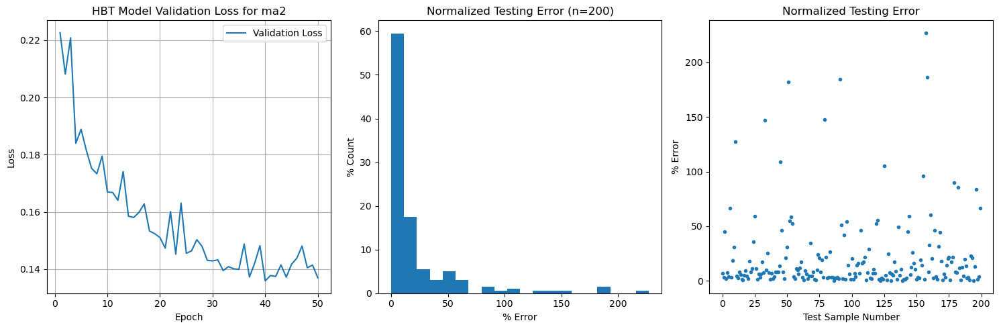

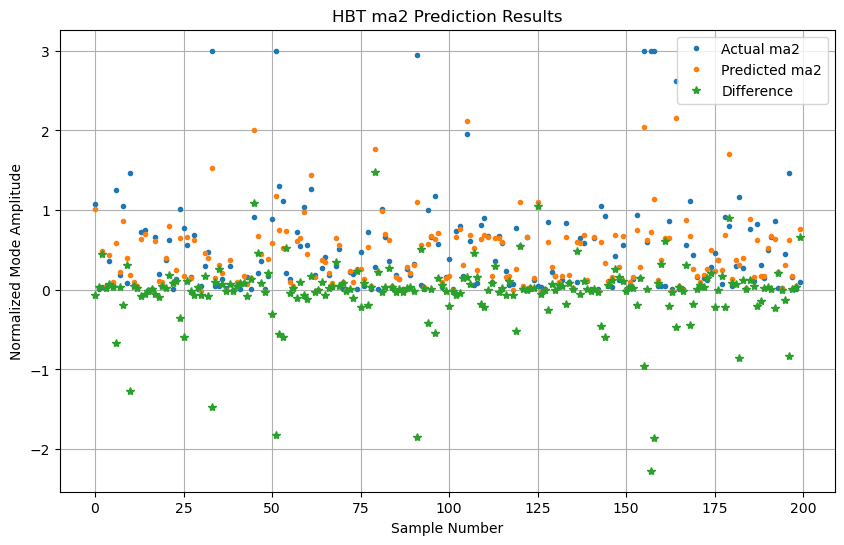

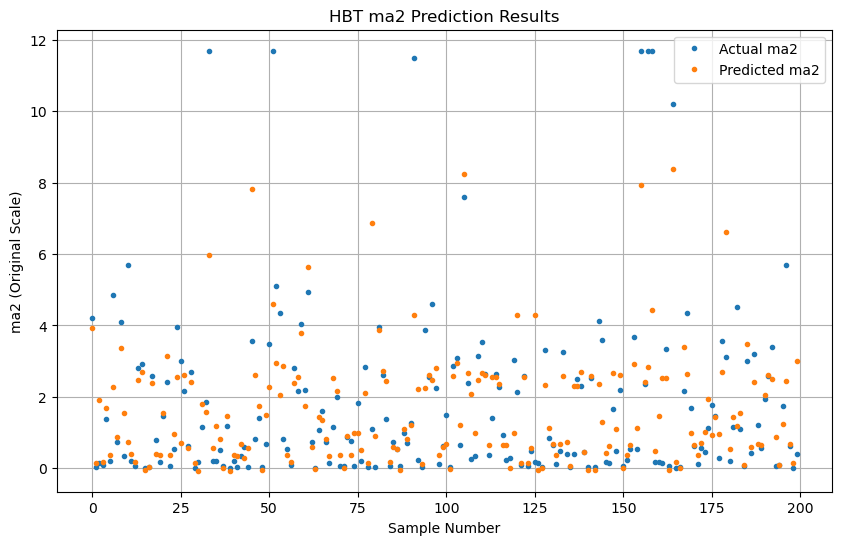

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 2.15
Mean absolute percentage error: 21.71%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

3.8972038269042963
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


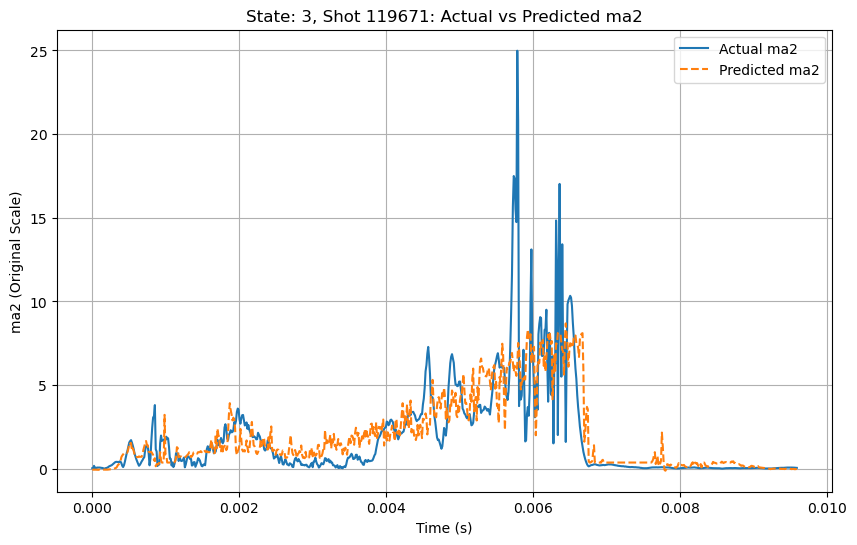

Shot 119671 - Mean absolute percentage error: 25.06%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 8.69


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
